In [1]:
import os.path as os

import torch
import torch.nn.functional as F

import torch_geometric.transforms as T
from torch_geometric.datasets import ModelNet
from torch_geometric.loader import DataLoader
from torch_geometric.nn import MLP, PointNetConv, fps, global_max_pool, radius
from torch_geometric.typing import WITH_TORCH_CLUSTER

if not WITH_TORCH_CLUSTER:
    quit("This example requires 'torch-cluster'")
    
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:
# data set imports
import dataset_utils as du
from torch.utils.data import DataLoader, random_split

B = 1 

# load dataset
dataset = du.SDFDataset("./cars995")
train_percent = 0.8

# split dataset into training and validation sets
train_size = int(train_percent * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# create data loaders for training and validation sets
train_loader = DataLoader(train_dataset, batch_size=B, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=B, shuffle=False, num_workers=2, pin_memory=True)

print(f"Train dataset size: {len(train_dataset)}, Validation dataset size: {len(val_dataset)}")

Train dataset size: 796, Validation dataset size: 199


In [3]:
def process_batch(batch, np_in=2048, np_q=15000):
    B, N, _ = batch.shape
    assert B == 1, "Batch size must be 1 for now."
    
    # # use surface points
    # surface_points = batch[batch[:, :, 3] == 0]
    idx = torch.randperm(N)[:np_in]
    pos = batch[:, idx, :3] # input positions (B, N, 3) -> (N, 3) # this is what fps expects
    x = batch[0, idx, 3].unsqueeze(-1)
    
    idx = torch.randperm(N)[:np_q]
    query_pos = batch[:, idx, :3] # query positions
    query_sdf = batch[:, idx, 3] # SDF values
    
    batch_vec = torch.zeros(np_in, dtype=torch.long) # batch vector for input points
    
    return x.to(device), pos.contiguous().squeeze(0).to(device), batch_vec.contiguous().squeeze(0).to(device), query_pos.squeeze(0).to(device), query_sdf.squeeze(0).to(device)

Define Layers and Model

In [4]:
class SAModule(torch.nn.Module):
    def __init__(self, ratio, r, nn):
        super().__init__()
        self.ratio = ratio
        self.r = r
        self.conv = PointNetConv(nn, add_self_loops=False)

    def forward(self, x, pos, batch):
        idx = fps(pos, batch, ratio=self.ratio)
        row, col = radius(pos, pos[idx], self.r, batch, batch[idx],
                          max_num_neighbors=128)
        edge_index = torch.stack([col, row], dim=0)
        x_dst = None if x is None else x[idx]
        x = self.conv((x, x_dst), (pos, pos[idx]), edge_index)
        pos, batch = pos[idx], batch[idx]
        return x, pos, batch


class GlobalSAModule(torch.nn.Module):
    def __init__(self, nn):
        super().__init__()
        self.nn = nn

    def forward(self, x, pos, batch):
        x = self.nn(torch.cat([x, pos], dim=1))
        x = global_max_pool(x, batch)
        pos = pos.new_zeros((x.size(0), 3))
        batch = torch.arange(x.size(0), device=batch.device)
        return x, pos, batch


class Net(torch.nn.Module):
    def __init__(self):
        super().__init__()

        # Input channels account for both `pos` and node features.
        self.sa1_module = SAModule(0.5, 0.2, MLP([4, 64, 64, 128]))
        self.sa2_module = SAModule(0.25, 0.5, MLP([128 + 3, 128, 128, 256]))
        self.sa3_module = GlobalSAModule(MLP([256 + 3, 256, 512, 1024]))

        self.encode = MLP([1024, 512, 256], dropout=0.3, norm=None)
        self.sdf = MLP([256 + 3, 128, 64, 1], dropout=0.3, norm=None)

    def forward(self, x, pos, batch, query_pos):
        # encode shape
        sa0_out = (x, pos, batch)
        sa1_out = self.sa1_module(*sa0_out)
        sa2_out = self.sa2_module(*sa1_out)
        sa3_out = self.sa3_module(*sa2_out)
        x, pos, batch = sa3_out
        
        x = self.encode(x)
        x = torch.cat((x.squeeze(0).repeat(query_pos.shape[0], 1), query_pos), dim=-1) # concatenate encoded shape with query positions

        return self.sdf(x)

In [5]:
# # test
# # make random tensor of shape (256, 3) 
# x = torch.randn(1, 256)
# queries = torch.randn(1024, 3) # queries for SDF values

# # want to make a tensor of shape (1024, 256 + 3) where the first 256 columns are the x values and the last 3 columns are the query positions
# x = torch.cat((x.squeeze(0).repeat(1024, 1), queries), dim=-1)  # (1024, 256 + 3)
# mlp = MLP([256 + 3, 128, 64, 1], dropout=0.5, norm=None)  # MLP for SDF prediction
# x = mlp(x)  # (B, 1024, 1)

# print(f"x shape: {x.shape}")
# print(f"queries shape: {queries.shape[1]}")

In [6]:
# test model
model = Net().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

batch = next(iter(train_loader))
print(f'Batch shape: {batch.shape}')
x, pos, batch, query_pos, query_sdf = process_batch(batch)
print(f'pos shape: {pos.shape}, query_pos shape: {query_pos.shape}, query_sdf shape: {query_sdf.shape}, x shape: {x.shape}')

print(f'pos shape: {pos.shape}')
# forward pass
output = model(x, pos, batch, query_pos)
# print output shape
print(f"Output shape: {output.shape}")

Batch shape: torch.Size([1, 30000, 4])
pos shape: torch.Size([2048, 3]), query_pos shape: torch.Size([15000, 3]), query_sdf shape: torch.Size([15000]), x shape: torch.Size([2048, 1])
pos shape: torch.Size([2048, 3])


Output shape: torch.Size([15000, 1])


MODEL


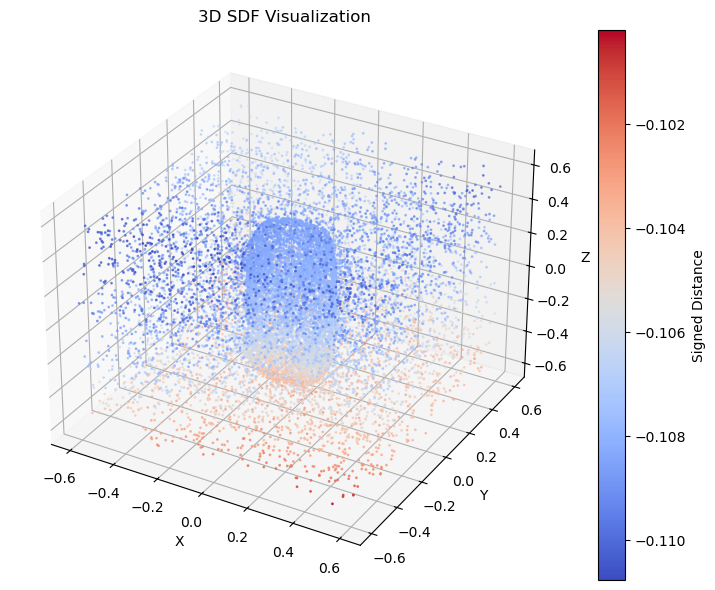

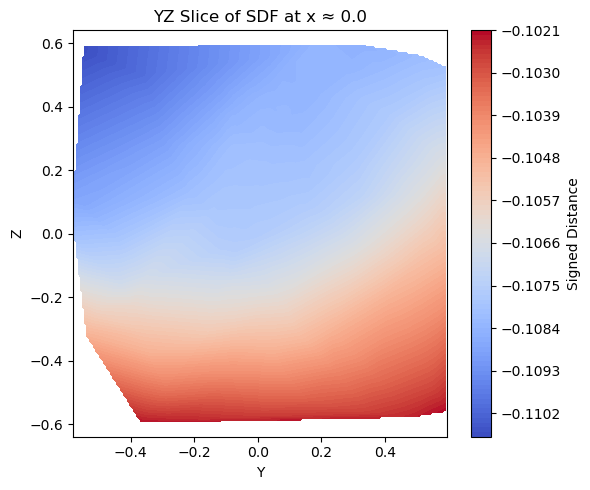

TRUTH


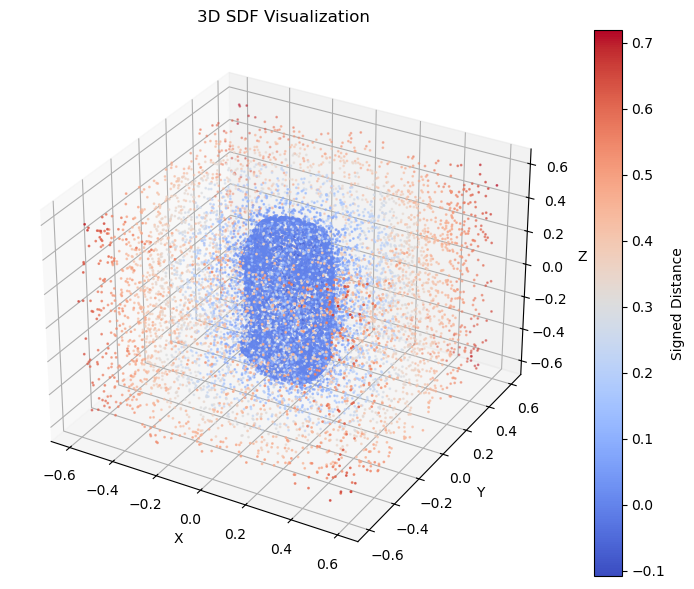

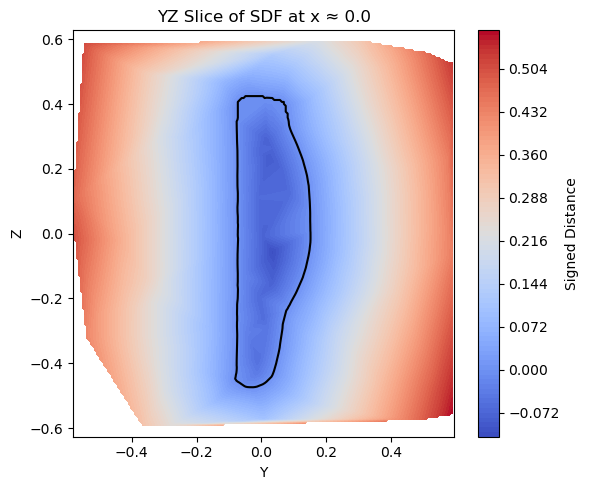

Validation Loss: 0.11110435426235199


In [7]:
def show_validation():
    model.eval()
    batch = next(iter(val_loader))
    x, pos, batch, query_pos, query_sdf = process_batch(batch)
    output = model(x, pos, batch, query_pos)


    prediction = torch.cat((query_pos, output), dim=-1).detach().cpu()  # (1024, 3 + 1)
    truth = torch.cat((query_pos, query_sdf.unsqueeze(-1)), dim=-1).detach().cpu()  # (1024, 3 + 1)

    print("MODEL")
    du.visualize_sdf_3d(prediction)
    du.visualize_sdf_2d(prediction)
    print("TRUTH")
    du.visualize_sdf_3d(truth)
    du.visualize_sdf_2d(truth)

    loss = F.mse_loss(output.squeeze(-1), query_sdf)  # L1 loss for SDF prediction
    print("Validation Loss:", loss.item())

show_validation()

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 1/1500 [00:11<4:58:07, 11.93s/it]

  0%|          | 2/1500 [00:23<4:57:33, 11.92s/it]

  0%|          | 3/1500 [00:35<4:56:20, 11.88s/it]

  0%|          | 4/1500 [00:47<4:55:49, 11.86s/it]

  0%|          | 5/1500 [00:59<4:56:15, 11.89s/it]

  0%|          | 6/1500 [01:11<4:55:50, 11.88s/it]

  0%|          | 7/1500 [01:23<4:55:33, 11.88s/it]

  1%|          | 8/1500 [01:35<4:55:46, 11.89s/it]

  1%|          | 9/1500 [01:47<4:56:27, 11.93s/it]

  1%|          | 10/1500 [01:59<4:57:20, 11.97s/it]

  1%|          | 11/1500 [02:11<4:58:42, 12.04s/it]

  1%|          | 12/1500 [02:23<4:59:20, 12.07s/it]

  1%|          | 13/1500 [02:35<4:59:44, 12.09s/it]

  1%|          | 14/1500 [02:47<5:00:01, 12.11s/it]

  1%|          | 15/1500 [02:59<4:59:56, 12.12s/it]

  1%|          | 16/1500 [03:12<4:59:57, 12.13s/it]

  1%|          | 17/1500 [03:24<4:58:51, 12.09s/it]

  1%|          | 18/1500 [03:36<4:58:29, 12.08s/it]

  1%|▏         | 19/1500 [03:48<4:58:39, 12.10s/it]

  1%|▏         | 20/1500 [04:00<4:58:51, 12.12s/it]

Loss: 0.0016


  1%|▏         | 21/1500 [04:12<4:58:55, 12.13s/it]

  1%|▏         | 22/1500 [04:24<4:59:10, 12.14s/it]

  2%|▏         | 23/1500 [04:36<4:59:07, 12.15s/it]

  2%|▏         | 24/1500 [04:49<4:59:01, 12.16s/it]

  2%|▏         | 25/1500 [05:01<4:58:49, 12.16s/it]

  2%|▏         | 26/1500 [05:13<4:58:27, 12.15s/it]

  2%|▏         | 27/1500 [05:25<4:58:30, 12.16s/it]

  2%|▏         | 28/1500 [05:37<4:58:26, 12.16s/it]

  2%|▏         | 29/1500 [05:49<4:58:16, 12.17s/it]

  2%|▏         | 30/1500 [06:02<4:58:11, 12.17s/it]

  2%|▏         | 31/1500 [06:14<4:57:44, 12.16s/it]

  2%|▏         | 32/1500 [06:26<4:57:31, 12.16s/it]

  2%|▏         | 33/1500 [06:38<4:57:12, 12.16s/it]

  2%|▏         | 34/1500 [06:50<4:56:56, 12.15s/it]

  2%|▏         | 35/1500 [07:02<4:56:52, 12.16s/it]

  2%|▏         | 36/1500 [07:15<4:56:33, 12.15s/it]

  2%|▏         | 37/1500 [07:27<4:56:04, 12.14s/it]

  3%|▎         | 38/1500 [07:39<4:55:45, 12.14s/it]

  3%|▎         | 39/1500 [07:51<4:55:28, 12.13s/it]

  3%|▎         | 40/1500 [08:03<4:55:27, 12.14s/it]

Loss: 0.0015


  3%|▎         | 41/1500 [08:15<4:55:21, 12.15s/it]

  3%|▎         | 42/1500 [08:27<4:55:27, 12.16s/it]

  3%|▎         | 43/1500 [08:40<4:55:22, 12.16s/it]

  3%|▎         | 44/1500 [08:52<4:55:15, 12.17s/it]

  3%|▎         | 45/1500 [09:04<4:55:10, 12.17s/it]

  3%|▎         | 46/1500 [09:16<4:54:49, 12.17s/it]

  3%|▎         | 47/1500 [09:28<4:54:28, 12.16s/it]

  3%|▎         | 48/1500 [09:40<4:54:10, 12.16s/it]

  3%|▎         | 49/1500 [09:53<4:54:05, 12.16s/it]

  3%|▎         | 50/1500 [10:05<4:53:30, 12.15s/it]

  3%|▎         | 51/1500 [10:17<4:53:24, 12.15s/it]

  3%|▎         | 52/1500 [10:29<4:53:26, 12.16s/it]

  4%|▎         | 53/1500 [10:41<4:53:15, 12.16s/it]

  4%|▎         | 54/1500 [10:53<4:53:04, 12.16s/it]

  4%|▎         | 55/1500 [11:06<4:52:59, 12.17s/it]

  4%|▎         | 56/1500 [11:18<4:52:47, 12.17s/it]

  4%|▍         | 57/1500 [11:30<4:52:28, 12.16s/it]

  4%|▍         | 58/1500 [11:42<4:52:11, 12.16s/it]

  4%|▍         | 59/1500 [11:54<4:51:57, 12.16s/it]

  4%|▍         | 60/1500 [12:06<4:51:49, 12.16s/it]

Loss: 0.0019


  4%|▍         | 61/1500 [12:18<4:51:41, 12.16s/it]

  4%|▍         | 62/1500 [12:31<4:51:32, 12.16s/it]

  4%|▍         | 63/1500 [12:43<4:51:16, 12.16s/it]

  4%|▍         | 64/1500 [12:55<4:51:23, 12.18s/it]

  4%|▍         | 65/1500 [13:07<4:50:55, 12.16s/it]

  4%|▍         | 66/1500 [13:19<4:50:49, 12.17s/it]

  4%|▍         | 67/1500 [13:32<4:50:40, 12.17s/it]

  5%|▍         | 68/1500 [13:44<4:50:21, 12.17s/it]

  5%|▍         | 69/1500 [13:56<4:49:52, 12.15s/it]

  5%|▍         | 70/1500 [14:08<4:49:44, 12.16s/it]

  5%|▍         | 71/1500 [14:20<4:49:32, 12.16s/it]

  5%|▍         | 72/1500 [14:32<4:49:26, 12.16s/it]

  5%|▍         | 73/1500 [14:44<4:49:24, 12.17s/it]

  5%|▍         | 74/1500 [14:57<4:49:21, 12.17s/it]

  5%|▌         | 75/1500 [15:09<4:49:10, 12.18s/it]

  5%|▌         | 76/1500 [15:21<4:48:53, 12.17s/it]

  5%|▌         | 77/1500 [15:33<4:48:26, 12.16s/it]

  5%|▌         | 78/1500 [15:45<4:48:18, 12.17s/it]

  5%|▌         | 79/1500 [15:57<4:48:08, 12.17s/it]

  5%|▌         | 80/1500 [16:10<4:47:58, 12.17s/it]

Loss: 0.0013


  5%|▌         | 81/1500 [16:22<4:47:38, 12.16s/it]

  5%|▌         | 82/1500 [16:34<4:47:16, 12.16s/it]

  6%|▌         | 83/1500 [16:46<4:47:06, 12.16s/it]

  6%|▌         | 84/1500 [16:58<4:46:58, 12.16s/it]

  6%|▌         | 85/1500 [17:10<4:46:47, 12.16s/it]

  6%|▌         | 86/1500 [17:23<4:46:35, 12.16s/it]

  6%|▌         | 87/1500 [17:35<4:46:29, 12.16s/it]

  6%|▌         | 88/1500 [17:47<4:46:06, 12.16s/it]

  6%|▌         | 89/1500 [17:59<4:45:46, 12.15s/it]

  6%|▌         | 90/1500 [18:11<4:45:39, 12.16s/it]

  6%|▌         | 91/1500 [18:23<4:45:26, 12.15s/it]

  6%|▌         | 92/1500 [18:36<4:45:15, 12.16s/it]

  6%|▌         | 93/1500 [18:48<4:45:06, 12.16s/it]

  6%|▋         | 94/1500 [19:00<4:44:52, 12.16s/it]

  6%|▋         | 95/1500 [19:12<4:44:40, 12.16s/it]

  6%|▋         | 96/1500 [19:24<4:44:12, 12.15s/it]

  6%|▋         | 97/1500 [19:36<4:44:18, 12.16s/it]

  7%|▋         | 98/1500 [19:48<4:44:09, 12.16s/it]

  7%|▋         | 99/1500 [20:01<4:44:00, 12.16s/it]

Loss: 0.0019


MODEL


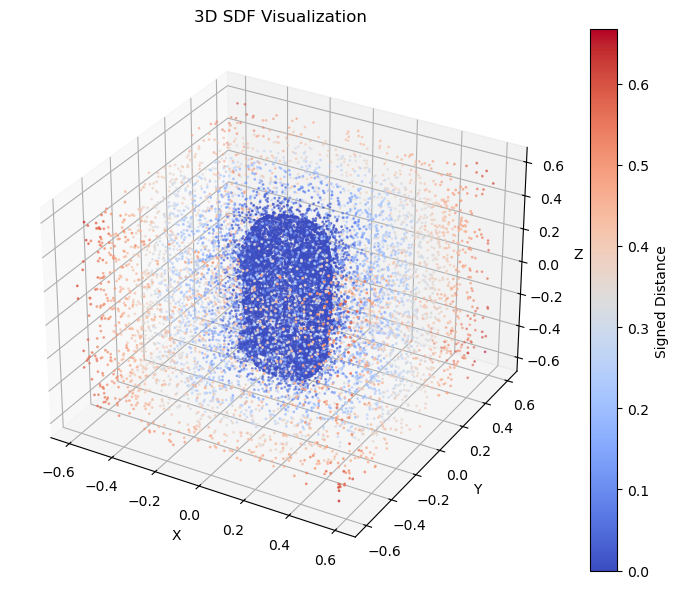

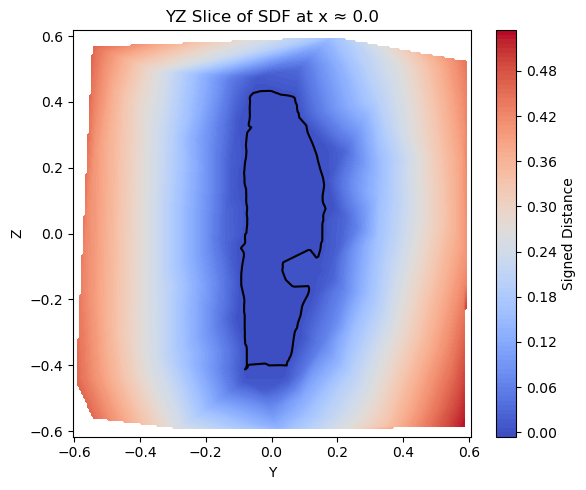

TRUTH


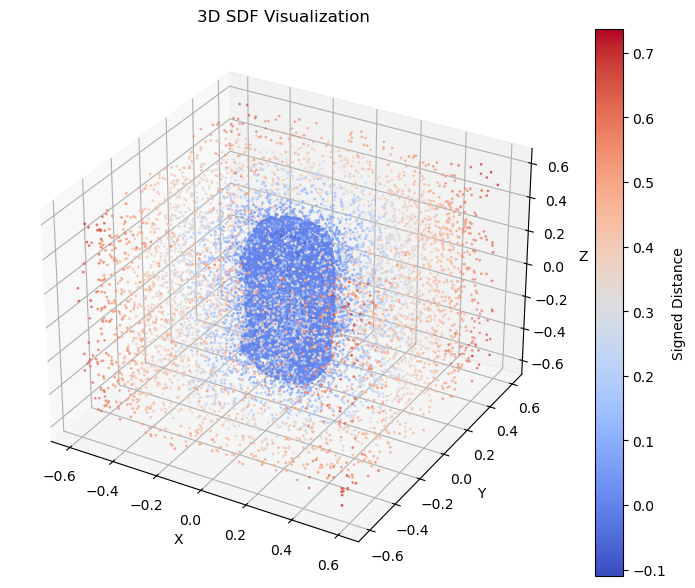

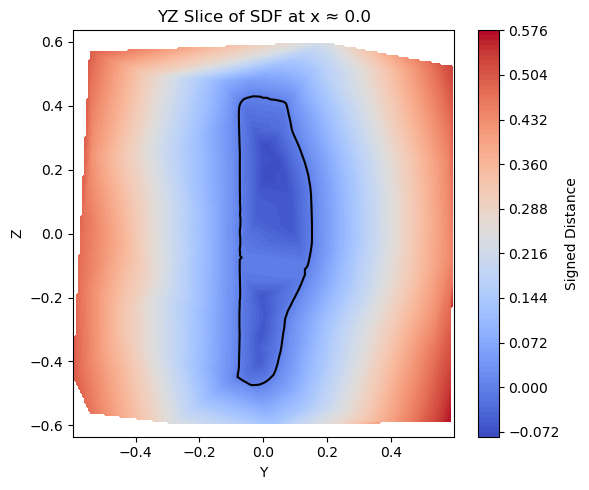

  7%|▋         | 100/1500 [20:14<4:55:43, 12.67s/it]

Validation Loss: 0.0009828739566728473


  7%|▋         | 101/1500 [20:27<4:52:18, 12.54s/it]

  7%|▋         | 102/1500 [20:39<4:49:36, 12.43s/it]

  7%|▋         | 103/1500 [20:51<4:47:52, 12.36s/it]

  7%|▋         | 104/1500 [21:03<4:46:19, 12.31s/it]

  7%|▋         | 105/1500 [21:15<4:45:12, 12.27s/it]

  7%|▋         | 106/1500 [21:28<4:44:28, 12.24s/it]

  7%|▋         | 107/1500 [21:40<4:43:51, 12.23s/it]

  7%|▋         | 108/1500 [21:52<4:43:11, 12.21s/it]

  7%|▋         | 109/1500 [22:04<4:42:49, 12.20s/it]

  7%|▋         | 110/1500 [22:16<4:42:25, 12.19s/it]

  7%|▋         | 111/1500 [22:28<4:41:50, 12.17s/it]

  7%|▋         | 112/1500 [22:41<4:41:46, 12.18s/it]

  8%|▊         | 113/1500 [22:53<4:41:16, 12.17s/it]

  8%|▊         | 114/1500 [23:05<4:41:06, 12.17s/it]

  8%|▊         | 115/1500 [23:17<4:40:59, 12.17s/it]

  8%|▊         | 116/1500 [23:29<4:40:49, 12.17s/it]

  8%|▊         | 117/1500 [23:42<4:40:37, 12.17s/it]

  8%|▊         | 118/1500 [23:54<4:40:33, 12.18s/it]

  8%|▊         | 119/1500 [24:06<4:40:19, 12.18s/it]

  8%|▊         | 120/1500 [24:18<4:39:56, 12.17s/it]

Loss: 0.0012


  8%|▊         | 121/1500 [24:30<4:39:49, 12.18s/it]

  8%|▊         | 122/1500 [24:42<4:39:44, 12.18s/it]

  8%|▊         | 123/1500 [24:55<4:39:26, 12.18s/it]

  8%|▊         | 124/1500 [25:07<4:39:21, 12.18s/it]

  8%|▊         | 125/1500 [25:19<4:39:06, 12.18s/it]

  8%|▊         | 126/1500 [25:31<4:38:55, 12.18s/it]

  8%|▊         | 127/1500 [25:43<4:37:44, 12.14s/it]

  9%|▊         | 128/1500 [25:55<4:36:49, 12.11s/it]

  9%|▊         | 129/1500 [26:07<4:36:20, 12.09s/it]

  9%|▊         | 130/1500 [26:19<4:36:39, 12.12s/it]

  9%|▊         | 131/1500 [26:32<4:36:33, 12.12s/it]

  9%|▉         | 132/1500 [26:44<4:36:15, 12.12s/it]

  9%|▉         | 133/1500 [26:56<4:36:21, 12.13s/it]

  9%|▉         | 134/1500 [27:08<4:36:25, 12.14s/it]

  9%|▉         | 135/1500 [27:20<4:36:27, 12.15s/it]

  9%|▉         | 136/1500 [27:32<4:36:28, 12.16s/it]

  9%|▉         | 137/1500 [27:45<4:36:07, 12.16s/it]

  9%|▉         | 138/1500 [27:57<4:35:46, 12.15s/it]

  9%|▉         | 139/1500 [28:09<4:35:01, 12.12s/it]

  9%|▉         | 140/1500 [28:21<4:34:58, 12.13s/it]

Loss: 0.0013


  9%|▉         | 141/1500 [28:33<4:34:34, 12.12s/it]

  9%|▉         | 142/1500 [28:45<4:34:40, 12.14s/it]

 10%|▉         | 143/1500 [28:57<4:34:01, 12.12s/it]

 10%|▉         | 144/1500 [29:09<4:33:34, 12.10s/it]

 10%|▉         | 145/1500 [29:21<4:33:27, 12.11s/it]

 10%|▉         | 146/1500 [29:34<4:34:04, 12.14s/it]

 10%|▉         | 147/1500 [29:46<4:33:34, 12.13s/it]

 10%|▉         | 148/1500 [29:58<4:33:05, 12.12s/it]

 10%|▉         | 149/1500 [30:10<4:32:53, 12.12s/it]

 10%|█         | 150/1500 [30:22<4:32:48, 12.13s/it]

 10%|█         | 151/1500 [30:34<4:32:53, 12.14s/it]

 10%|█         | 152/1500 [30:46<4:32:35, 12.13s/it]

 10%|█         | 153/1500 [30:58<4:32:18, 12.13s/it]

 10%|█         | 154/1500 [31:11<4:32:24, 12.14s/it]

 10%|█         | 155/1500 [31:23<4:32:20, 12.15s/it]

 10%|█         | 156/1500 [31:35<4:32:24, 12.16s/it]

 10%|█         | 157/1500 [31:47<4:32:12, 12.16s/it]

 11%|█         | 158/1500 [31:59<4:31:53, 12.16s/it]

 11%|█         | 159/1500 [32:11<4:30:54, 12.12s/it]

 11%|█         | 160/1500 [32:23<4:30:44, 12.12s/it]

Loss: 0.0013


 11%|█         | 161/1500 [32:36<4:30:46, 12.13s/it]

 11%|█         | 162/1500 [32:48<4:30:55, 12.15s/it]

 11%|█         | 163/1500 [33:00<4:30:40, 12.15s/it]

 11%|█         | 164/1500 [33:12<4:30:29, 12.15s/it]

 11%|█         | 165/1500 [33:24<4:30:03, 12.14s/it]

 11%|█         | 166/1500 [33:36<4:29:59, 12.14s/it]

 11%|█         | 167/1500 [33:49<4:29:54, 12.15s/it]

 11%|█         | 168/1500 [34:01<4:29:30, 12.14s/it]

 11%|█▏        | 169/1500 [34:13<4:29:47, 12.16s/it]

 11%|█▏        | 170/1500 [34:25<4:29:42, 12.17s/it]

 11%|█▏        | 171/1500 [34:37<4:29:27, 12.17s/it]

 11%|█▏        | 172/1500 [34:49<4:29:24, 12.17s/it]

 12%|█▏        | 173/1500 [35:02<4:29:02, 12.16s/it]

 12%|█▏        | 174/1500 [35:14<4:28:43, 12.16s/it]

 12%|█▏        | 175/1500 [35:26<4:28:27, 12.16s/it]

 12%|█▏        | 176/1500 [35:38<4:28:20, 12.16s/it]

 12%|█▏        | 177/1500 [35:50<4:28:01, 12.16s/it]

 12%|█▏        | 178/1500 [36:02<4:27:50, 12.16s/it]

 12%|█▏        | 179/1500 [36:15<4:27:48, 12.16s/it]

 12%|█▏        | 180/1500 [36:27<4:27:33, 12.16s/it]

Loss: 0.0013


 12%|█▏        | 181/1500 [36:39<4:27:09, 12.15s/it]

 12%|█▏        | 182/1500 [36:51<4:26:59, 12.15s/it]

 12%|█▏        | 183/1500 [37:03<4:26:25, 12.14s/it]

 12%|█▏        | 184/1500 [37:15<4:26:17, 12.14s/it]

 12%|█▏        | 185/1500 [37:27<4:26:08, 12.14s/it]

 12%|█▏        | 186/1500 [37:39<4:25:40, 12.13s/it]

 12%|█▏        | 187/1500 [37:52<4:25:51, 12.15s/it]

 13%|█▎        | 188/1500 [38:04<4:25:43, 12.15s/it]

 13%|█▎        | 189/1500 [38:16<4:25:16, 12.14s/it]

 13%|█▎        | 190/1500 [38:28<4:25:28, 12.16s/it]

 13%|█▎        | 191/1500 [38:40<4:25:16, 12.16s/it]

 13%|█▎        | 192/1500 [38:52<4:24:52, 12.15s/it]

 13%|█▎        | 193/1500 [39:05<4:24:41, 12.15s/it]

 13%|█▎        | 194/1500 [39:17<4:24:11, 12.14s/it]

 13%|█▎        | 195/1500 [39:29<4:23:54, 12.13s/it]

 13%|█▎        | 196/1500 [39:41<4:23:55, 12.14s/it]

 13%|█▎        | 197/1500 [39:53<4:23:36, 12.14s/it]

 13%|█▎        | 198/1500 [40:05<4:23:18, 12.13s/it]

 13%|█▎        | 199/1500 [40:17<4:23:02, 12.13s/it]

Loss: 0.0014


MODEL


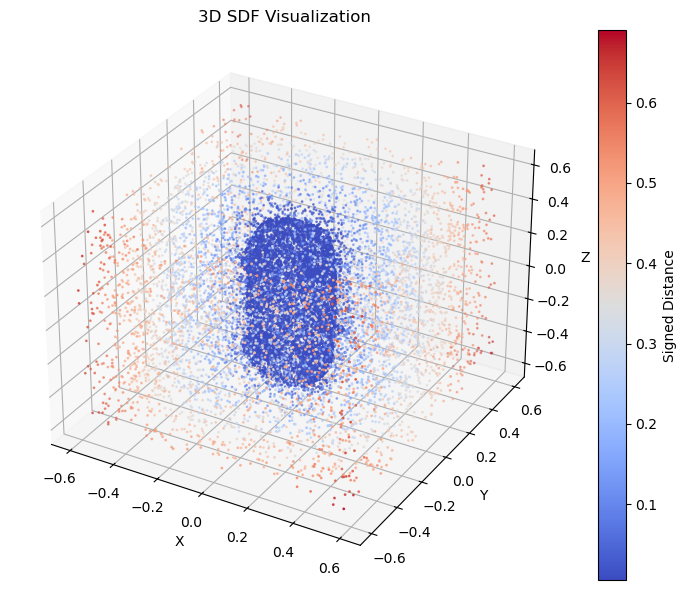

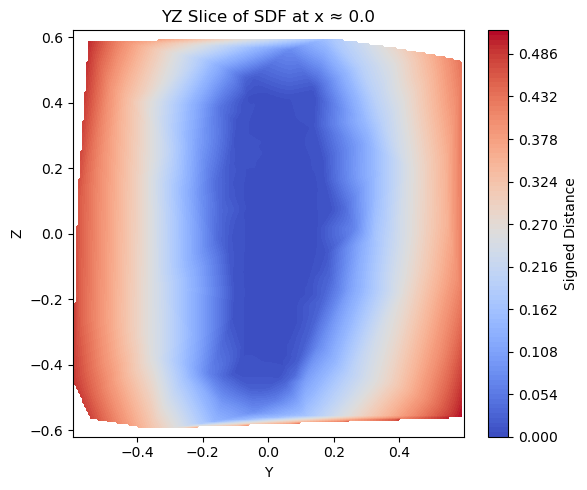

TRUTH


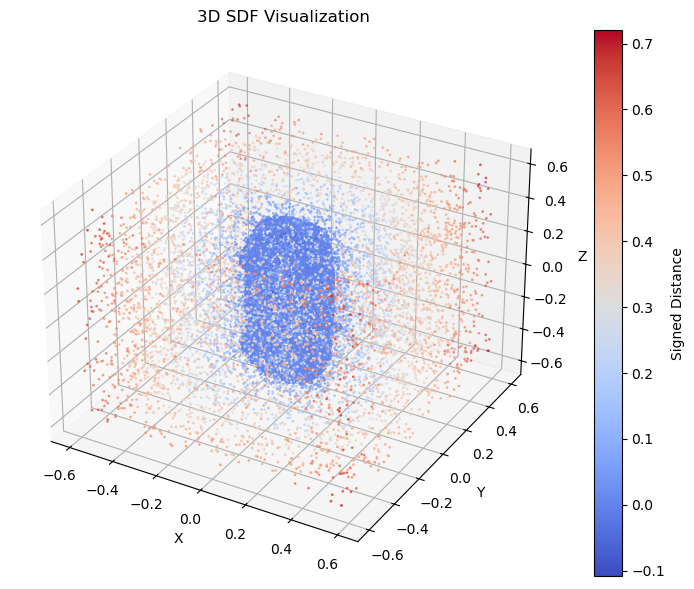

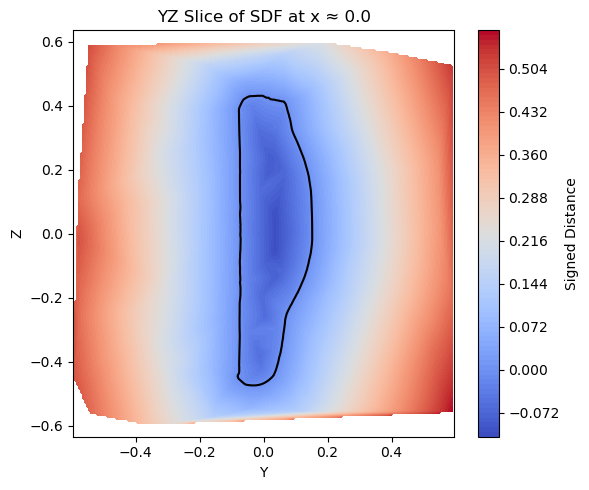

 13%|█▎        | 200/1500 [40:31<4:32:58, 12.60s/it]

Validation Loss: 0.0006397590623237193


 13%|█▎        | 201/1500 [40:43<4:30:12, 12.48s/it]

 13%|█▎        | 202/1500 [40:55<4:27:51, 12.38s/it]

 14%|█▎        | 203/1500 [41:08<4:26:26, 12.33s/it]

 14%|█▎        | 204/1500 [41:20<4:25:23, 12.29s/it]

 14%|█▎        | 205/1500 [41:32<4:24:42, 12.26s/it]

 14%|█▎        | 206/1500 [41:44<4:24:12, 12.25s/it]

 14%|█▍        | 207/1500 [41:56<4:23:40, 12.24s/it]

 14%|█▍        | 208/1500 [42:09<4:23:18, 12.23s/it]

 14%|█▍        | 209/1500 [42:21<4:22:52, 12.22s/it]

 14%|█▍        | 210/1500 [42:33<4:22:34, 12.21s/it]

 14%|█▍        | 211/1500 [42:45<4:22:24, 12.21s/it]

 14%|█▍        | 212/1500 [42:57<4:21:56, 12.20s/it]

 14%|█▍        | 213/1500 [43:10<4:21:41, 12.20s/it]

 14%|█▍        | 214/1500 [43:22<4:21:37, 12.21s/it]

 14%|█▍        | 215/1500 [43:34<4:21:12, 12.20s/it]

 14%|█▍        | 216/1500 [43:46<4:20:34, 12.18s/it]

 14%|█▍        | 217/1500 [43:58<4:20:33, 12.18s/it]

 15%|█▍        | 218/1500 [44:10<4:20:15, 12.18s/it]

 15%|█▍        | 219/1500 [44:23<4:20:03, 12.18s/it]

 15%|█▍        | 220/1500 [44:35<4:19:51, 12.18s/it]

Loss: 0.0016


 15%|█▍        | 221/1500 [44:47<4:19:31, 12.17s/it]

 15%|█▍        | 222/1500 [44:59<4:19:20, 12.18s/it]

 15%|█▍        | 223/1500 [45:11<4:19:10, 12.18s/it]

 15%|█▍        | 224/1500 [45:24<4:18:54, 12.17s/it]

 15%|█▌        | 225/1500 [45:36<4:18:42, 12.17s/it]

 15%|█▌        | 226/1500 [45:48<4:18:35, 12.18s/it]

 15%|█▌        | 227/1500 [46:00<4:17:55, 12.16s/it]

 15%|█▌        | 228/1500 [46:12<4:17:39, 12.15s/it]

 15%|█▌        | 229/1500 [46:24<4:17:53, 12.17s/it]

 15%|█▌        | 230/1500 [46:37<4:17:30, 12.17s/it]

 15%|█▌        | 231/1500 [46:49<4:17:26, 12.17s/it]

 15%|█▌        | 232/1500 [47:01<4:17:11, 12.17s/it]

 16%|█▌        | 233/1500 [47:13<4:16:59, 12.17s/it]

 16%|█▌        | 234/1500 [47:25<4:16:34, 12.16s/it]

 16%|█▌        | 235/1500 [47:37<4:16:18, 12.16s/it]

 16%|█▌        | 236/1500 [47:50<4:16:11, 12.16s/it]

 16%|█▌        | 237/1500 [48:02<4:16:09, 12.17s/it]

 16%|█▌        | 238/1500 [48:14<4:16:09, 12.18s/it]

 16%|█▌        | 239/1500 [48:26<4:15:59, 12.18s/it]

 16%|█▌        | 240/1500 [48:38<4:15:48, 12.18s/it]

Loss: 0.0014


 16%|█▌        | 241/1500 [48:50<4:15:44, 12.19s/it]

 16%|█▌        | 242/1500 [49:03<4:15:21, 12.18s/it]

 16%|█▌        | 243/1500 [49:15<4:15:04, 12.18s/it]

 16%|█▋        | 244/1500 [49:27<4:14:56, 12.18s/it]

 16%|█▋        | 245/1500 [49:39<4:14:32, 12.17s/it]

 16%|█▋        | 246/1500 [49:51<4:13:59, 12.15s/it]

 16%|█▋        | 247/1500 [50:03<4:13:59, 12.16s/it]

 17%|█▋        | 248/1500 [50:16<4:14:01, 12.17s/it]

 17%|█▋        | 249/1500 [50:28<4:13:41, 12.17s/it]

 17%|█▋        | 250/1500 [50:40<4:13:34, 12.17s/it]

 17%|█▋        | 251/1500 [50:52<4:13:23, 12.17s/it]

 17%|█▋        | 252/1500 [51:04<4:12:53, 12.16s/it]

 17%|█▋        | 253/1500 [51:16<4:12:47, 12.16s/it]

 17%|█▋        | 254/1500 [51:29<4:12:16, 12.15s/it]

 17%|█▋        | 255/1500 [51:41<4:12:06, 12.15s/it]

 17%|█▋        | 256/1500 [51:53<4:11:45, 12.14s/it]

 17%|█▋        | 257/1500 [52:05<4:11:36, 12.14s/it]

 17%|█▋        | 258/1500 [52:17<4:11:30, 12.15s/it]

 17%|█▋        | 259/1500 [52:29<4:11:48, 12.17s/it]

 17%|█▋        | 260/1500 [52:41<4:11:12, 12.16s/it]

Loss: 0.0014


 17%|█▋        | 261/1500 [52:54<4:10:55, 12.15s/it]

 17%|█▋        | 262/1500 [53:06<4:11:04, 12.17s/it]

 18%|█▊        | 263/1500 [53:18<4:10:59, 12.17s/it]

 18%|█▊        | 264/1500 [53:30<4:10:38, 12.17s/it]

 18%|█▊        | 265/1500 [53:42<4:10:37, 12.18s/it]

 18%|█▊        | 266/1500 [53:55<4:10:20, 12.17s/it]

 18%|█▊        | 267/1500 [54:07<4:10:01, 12.17s/it]

 18%|█▊        | 268/1500 [54:19<4:10:04, 12.18s/it]

 18%|█▊        | 269/1500 [54:31<4:09:51, 12.18s/it]

 18%|█▊        | 270/1500 [54:43<4:09:25, 12.17s/it]

 18%|█▊        | 271/1500 [54:55<4:09:14, 12.17s/it]

 18%|█▊        | 272/1500 [55:08<4:08:48, 12.16s/it]

 18%|█▊        | 273/1500 [55:20<4:08:38, 12.16s/it]

 18%|█▊        | 274/1500 [55:32<4:08:24, 12.16s/it]

 18%|█▊        | 275/1500 [55:44<4:07:30, 12.12s/it]

 18%|█▊        | 276/1500 [55:56<4:06:33, 12.09s/it]

 18%|█▊        | 277/1500 [56:08<4:06:27, 12.09s/it]

 19%|█▊        | 278/1500 [56:20<4:06:33, 12.11s/it]

 19%|█▊        | 279/1500 [56:32<4:06:48, 12.13s/it]

 19%|█▊        | 280/1500 [56:44<4:07:04, 12.15s/it]

Loss: 0.0014


 19%|█▊        | 281/1500 [56:57<4:07:00, 12.16s/it]

 19%|█▉        | 282/1500 [57:09<4:06:49, 12.16s/it]

 19%|█▉        | 283/1500 [57:21<4:06:42, 12.16s/it]

 19%|█▉        | 284/1500 [57:33<4:06:34, 12.17s/it]

 19%|█▉        | 285/1500 [57:45<4:06:31, 12.17s/it]

 19%|█▉        | 286/1500 [57:58<4:06:25, 12.18s/it]

 19%|█▉        | 287/1500 [58:10<4:05:36, 12.15s/it]

 19%|█▉        | 288/1500 [58:22<4:05:16, 12.14s/it]

 19%|█▉        | 289/1500 [58:34<4:05:03, 12.14s/it]

 19%|█▉        | 290/1500 [58:46<4:04:51, 12.14s/it]

 19%|█▉        | 291/1500 [58:58<4:04:42, 12.14s/it]

 19%|█▉        | 292/1500 [59:10<4:04:29, 12.14s/it]

 20%|█▉        | 293/1500 [59:22<4:04:21, 12.15s/it]

 20%|█▉        | 294/1500 [59:35<4:04:20, 12.16s/it]

 20%|█▉        | 295/1500 [59:47<4:04:16, 12.16s/it]

 20%|█▉        | 296/1500 [59:59<4:04:09, 12.17s/it]

 20%|█▉        | 297/1500 [1:00:11<4:04:02, 12.17s/it]

 20%|█▉        | 298/1500 [1:00:23<4:03:40, 12.16s/it]

 20%|█▉        | 299/1500 [1:00:36<4:03:25, 12.16s/it]

Loss: 0.0013


MODEL


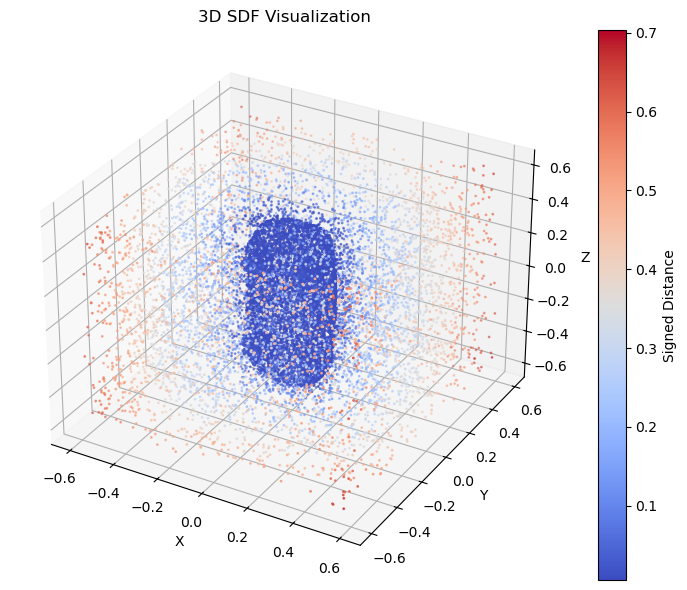

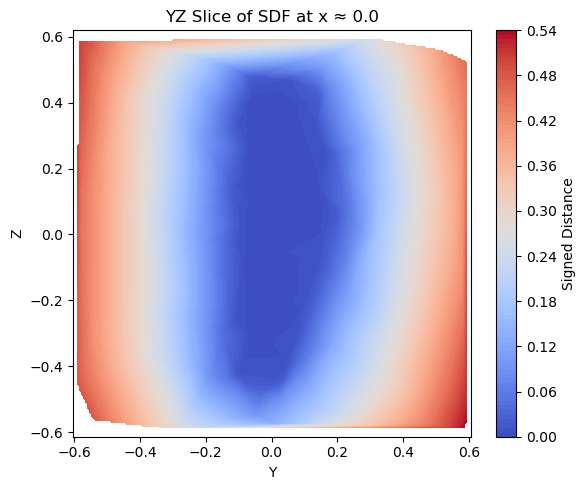

TRUTH


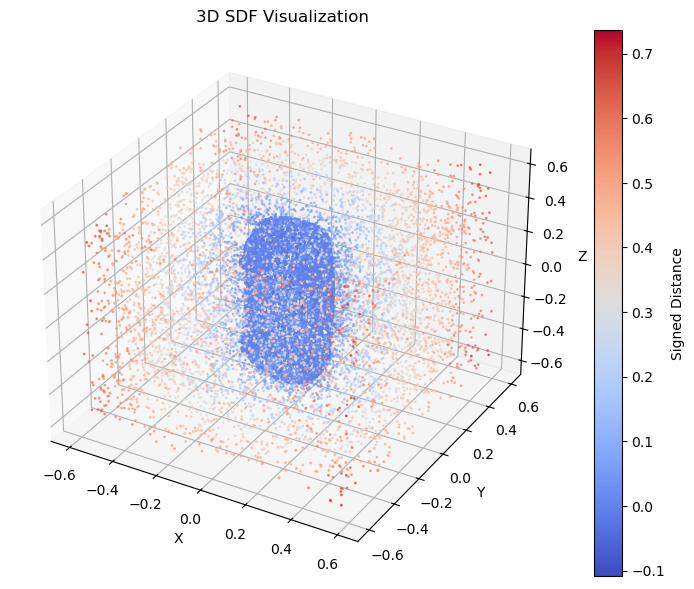

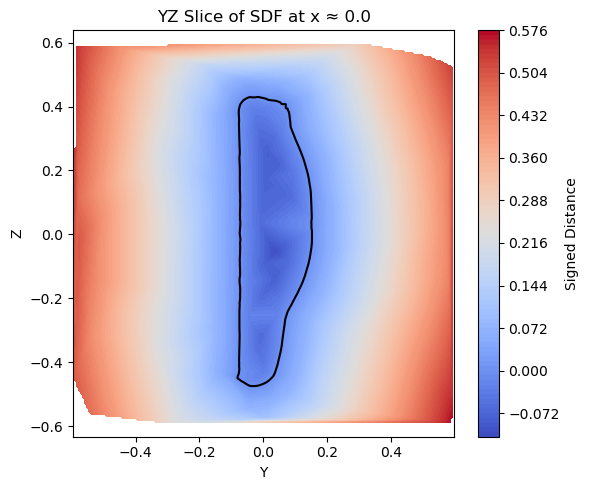

 20%|██        | 300/1500 [1:00:49<4:12:36, 12.63s/it]

Validation Loss: 0.0005093052168376744


 20%|██        | 301/1500 [1:01:01<4:09:38, 12.49s/it]

 20%|██        | 302/1500 [1:01:14<4:07:40, 12.40s/it]

 20%|██        | 303/1500 [1:01:26<4:06:02, 12.33s/it]

 20%|██        | 304/1500 [1:01:38<4:04:30, 12.27s/it]

 20%|██        | 305/1500 [1:01:50<4:03:34, 12.23s/it]

 20%|██        | 306/1500 [1:02:02<4:02:52, 12.20s/it]

 20%|██        | 307/1500 [1:02:14<4:02:20, 12.19s/it]

 21%|██        | 308/1500 [1:02:26<4:01:52, 12.17s/it]

 21%|██        | 309/1500 [1:02:38<4:00:39, 12.12s/it]

 21%|██        | 310/1500 [1:02:51<4:00:07, 12.11s/it]

 21%|██        | 311/1500 [1:03:03<4:00:17, 12.13s/it]

 21%|██        | 312/1500 [1:03:15<4:00:06, 12.13s/it]

 21%|██        | 313/1500 [1:03:27<3:59:54, 12.13s/it]

 21%|██        | 314/1500 [1:03:39<3:59:42, 12.13s/it]

 21%|██        | 315/1500 [1:03:51<4:00:07, 12.16s/it]

 21%|██        | 316/1500 [1:04:04<4:00:06, 12.17s/it]

 21%|██        | 317/1500 [1:04:16<3:59:59, 12.17s/it]

 21%|██        | 318/1500 [1:04:28<3:59:48, 12.17s/it]

 21%|██▏       | 319/1500 [1:04:40<3:59:40, 12.18s/it]

 21%|██▏       | 320/1500 [1:04:52<3:59:22, 12.17s/it]

Loss: 0.0014


 21%|██▏       | 321/1500 [1:05:04<3:59:01, 12.16s/it]

 21%|██▏       | 322/1500 [1:05:17<3:58:54, 12.17s/it]

 22%|██▏       | 323/1500 [1:05:29<3:58:45, 12.17s/it]

 22%|██▏       | 324/1500 [1:05:41<3:58:28, 12.17s/it]

 22%|██▏       | 325/1500 [1:05:53<3:58:11, 12.16s/it]

 22%|██▏       | 326/1500 [1:06:05<3:57:52, 12.16s/it]

 22%|██▏       | 327/1500 [1:06:17<3:57:45, 12.16s/it]

 22%|██▏       | 328/1500 [1:06:30<3:57:39, 12.17s/it]

 22%|██▏       | 329/1500 [1:06:42<3:57:28, 12.17s/it]

 22%|██▏       | 330/1500 [1:06:54<3:57:12, 12.16s/it]

 22%|██▏       | 331/1500 [1:07:06<3:56:51, 12.16s/it]

 22%|██▏       | 332/1500 [1:07:18<3:56:29, 12.15s/it]

 22%|██▏       | 333/1500 [1:07:30<3:56:26, 12.16s/it]

 22%|██▏       | 334/1500 [1:07:42<3:56:26, 12.17s/it]

 22%|██▏       | 335/1500 [1:07:55<3:56:15, 12.17s/it]

 22%|██▏       | 336/1500 [1:08:07<3:56:09, 12.17s/it]

 22%|██▏       | 337/1500 [1:08:19<3:56:02, 12.18s/it]

 23%|██▎       | 338/1500 [1:08:31<3:56:01, 12.19s/it]

 23%|██▎       | 339/1500 [1:08:43<3:55:53, 12.19s/it]

 23%|██▎       | 340/1500 [1:08:56<3:55:49, 12.20s/it]

Loss: 0.0017


 23%|██▎       | 341/1500 [1:09:08<3:55:29, 12.19s/it]

 23%|██▎       | 342/1500 [1:09:20<3:55:15, 12.19s/it]

 23%|██▎       | 343/1500 [1:09:32<3:55:03, 12.19s/it]

 23%|██▎       | 344/1500 [1:09:44<3:54:49, 12.19s/it]

 23%|██▎       | 345/1500 [1:09:57<3:54:34, 12.19s/it]

 23%|██▎       | 346/1500 [1:10:09<3:54:18, 12.18s/it]

 23%|██▎       | 347/1500 [1:10:21<3:54:00, 12.18s/it]

 23%|██▎       | 348/1500 [1:10:33<3:53:33, 12.16s/it]

 23%|██▎       | 349/1500 [1:10:45<3:53:24, 12.17s/it]

 23%|██▎       | 350/1500 [1:10:57<3:52:58, 12.16s/it]

 23%|██▎       | 351/1500 [1:11:09<3:52:32, 12.14s/it]

 23%|██▎       | 352/1500 [1:11:22<3:52:08, 12.13s/it]

 24%|██▎       | 353/1500 [1:11:34<3:52:03, 12.14s/it]

 24%|██▎       | 354/1500 [1:11:46<3:51:47, 12.14s/it]

 24%|██▎       | 355/1500 [1:11:58<3:51:35, 12.14s/it]

 24%|██▎       | 356/1500 [1:12:10<3:51:24, 12.14s/it]

 24%|██▍       | 357/1500 [1:12:22<3:51:13, 12.14s/it]

 24%|██▍       | 358/1500 [1:12:34<3:51:19, 12.15s/it]

 24%|██▍       | 359/1500 [1:12:47<3:51:00, 12.15s/it]

 24%|██▍       | 360/1500 [1:12:59<3:50:43, 12.14s/it]

Loss: 0.0017


 24%|██▍       | 361/1500 [1:13:11<3:50:40, 12.15s/it]

 24%|██▍       | 362/1500 [1:13:23<3:50:28, 12.15s/it]

 24%|██▍       | 363/1500 [1:13:35<3:50:19, 12.15s/it]

 24%|██▍       | 364/1500 [1:13:47<3:50:15, 12.16s/it]

 24%|██▍       | 365/1500 [1:14:00<3:49:59, 12.16s/it]

 24%|██▍       | 366/1500 [1:14:12<3:49:49, 12.16s/it]

 24%|██▍       | 367/1500 [1:14:24<3:49:41, 12.16s/it]

 25%|██▍       | 368/1500 [1:14:36<3:49:26, 12.16s/it]

 25%|██▍       | 369/1500 [1:14:48<3:49:15, 12.16s/it]

 25%|██▍       | 370/1500 [1:15:00<3:49:09, 12.17s/it]

 25%|██▍       | 371/1500 [1:15:13<3:48:59, 12.17s/it]

 25%|██▍       | 372/1500 [1:15:25<3:48:51, 12.17s/it]

 25%|██▍       | 373/1500 [1:15:37<3:48:47, 12.18s/it]

 25%|██▍       | 374/1500 [1:15:49<3:48:24, 12.17s/it]

 25%|██▌       | 375/1500 [1:16:01<3:48:05, 12.17s/it]

 25%|██▌       | 376/1500 [1:16:13<3:47:58, 12.17s/it]

 25%|██▌       | 377/1500 [1:16:26<3:47:51, 12.17s/it]

 25%|██▌       | 378/1500 [1:16:38<3:47:45, 12.18s/it]

 25%|██▌       | 379/1500 [1:16:50<3:47:42, 12.19s/it]

 25%|██▌       | 380/1500 [1:17:02<3:47:25, 12.18s/it]

Loss: 0.0013


 25%|██▌       | 381/1500 [1:17:14<3:47:08, 12.18s/it]

 25%|██▌       | 382/1500 [1:17:27<3:47:00, 12.18s/it]

 26%|██▌       | 383/1500 [1:17:39<3:46:44, 12.18s/it]

 26%|██▌       | 384/1500 [1:17:51<3:46:04, 12.15s/it]

 26%|██▌       | 385/1500 [1:18:03<3:45:55, 12.16s/it]

 26%|██▌       | 386/1500 [1:18:15<3:45:51, 12.16s/it]

 26%|██▌       | 387/1500 [1:18:27<3:45:54, 12.18s/it]

 26%|██▌       | 388/1500 [1:18:40<3:45:56, 12.19s/it]

 26%|██▌       | 389/1500 [1:18:52<3:45:47, 12.19s/it]

 26%|██▌       | 390/1500 [1:19:04<3:45:28, 12.19s/it]

 26%|██▌       | 391/1500 [1:19:16<3:45:19, 12.19s/it]

 26%|██▌       | 392/1500 [1:19:28<3:45:06, 12.19s/it]

 26%|██▌       | 393/1500 [1:19:41<3:44:53, 12.19s/it]

 26%|██▋       | 394/1500 [1:19:53<3:44:45, 12.19s/it]

 26%|██▋       | 395/1500 [1:20:05<3:44:32, 12.19s/it]

 26%|██▋       | 396/1500 [1:20:17<3:44:21, 12.19s/it]

 26%|██▋       | 397/1500 [1:20:29<3:44:14, 12.20s/it]

 27%|██▋       | 398/1500 [1:20:42<3:44:09, 12.20s/it]

 27%|██▋       | 399/1500 [1:20:54<3:43:44, 12.19s/it]

Loss: 0.0010


MODEL


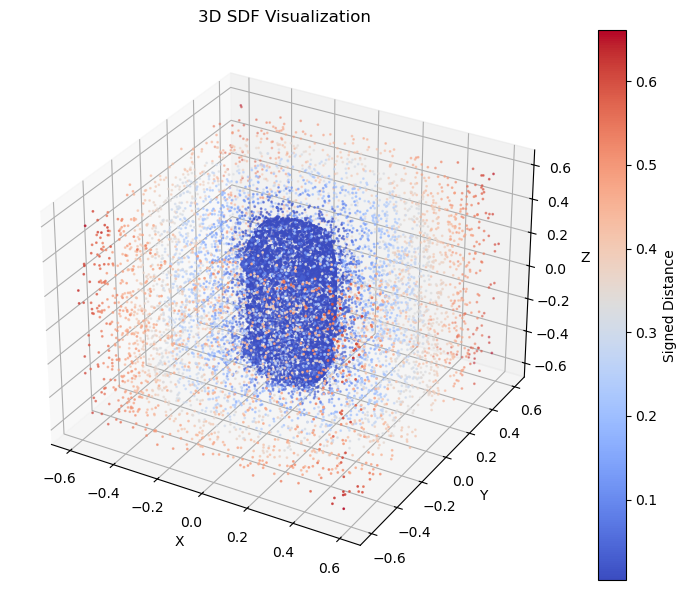

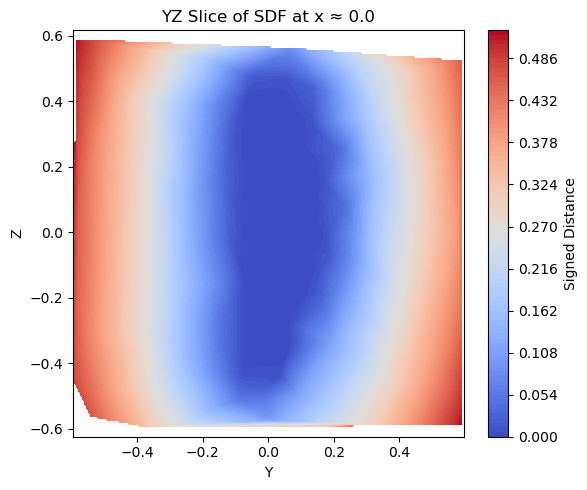

TRUTH


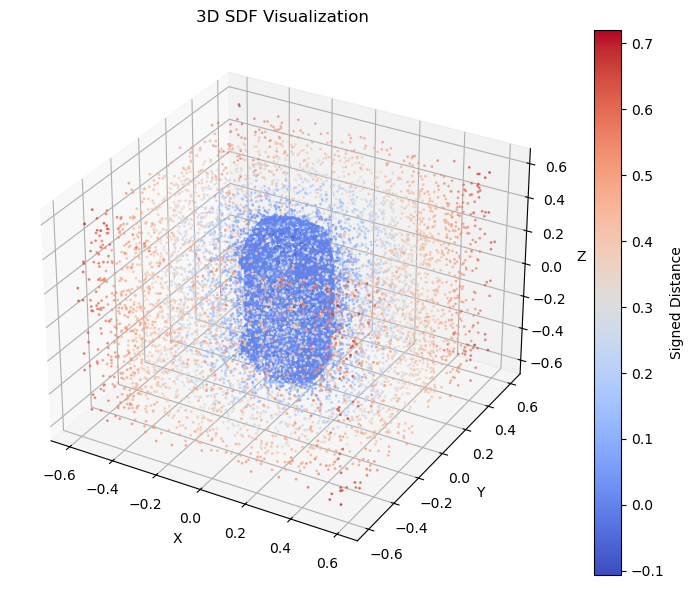

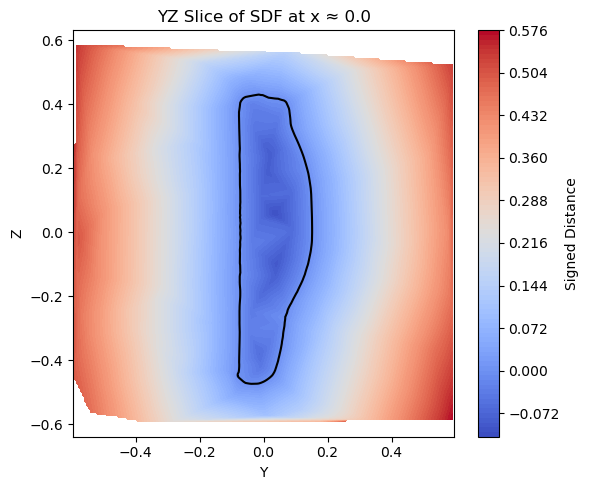

 27%|██▋       | 400/1500 [1:21:07<3:51:43, 12.64s/it]

Validation Loss: 0.0006062161992304027


 27%|██▋       | 401/1500 [1:21:20<3:48:51, 12.49s/it]

 27%|██▋       | 402/1500 [1:21:32<3:46:43, 12.39s/it]

 27%|██▋       | 403/1500 [1:21:44<3:45:24, 12.33s/it]

 27%|██▋       | 404/1500 [1:21:56<3:44:26, 12.29s/it]

 27%|██▋       | 405/1500 [1:22:08<3:43:43, 12.26s/it]

 27%|██▋       | 406/1500 [1:22:20<3:43:01, 12.23s/it]

 27%|██▋       | 407/1500 [1:22:33<3:42:32, 12.22s/it]

 27%|██▋       | 408/1500 [1:22:45<3:42:02, 12.20s/it]

 27%|██▋       | 409/1500 [1:22:57<3:41:44, 12.19s/it]

 27%|██▋       | 410/1500 [1:23:09<3:41:18, 12.18s/it]

 27%|██▋       | 411/1500 [1:23:21<3:40:57, 12.17s/it]

 27%|██▋       | 412/1500 [1:23:33<3:40:51, 12.18s/it]

 28%|██▊       | 413/1500 [1:23:46<3:40:31, 12.17s/it]

 28%|██▊       | 414/1500 [1:23:58<3:40:09, 12.16s/it]

 28%|██▊       | 415/1500 [1:24:10<3:39:47, 12.15s/it]

 28%|██▊       | 416/1500 [1:24:22<3:39:22, 12.14s/it]

 28%|██▊       | 417/1500 [1:24:34<3:38:49, 12.12s/it]

 28%|██▊       | 418/1500 [1:24:46<3:38:35, 12.12s/it]

 28%|██▊       | 419/1500 [1:24:58<3:38:13, 12.11s/it]

 28%|██▊       | 420/1500 [1:25:10<3:37:40, 12.09s/it]

Loss: 0.0014


 28%|██▊       | 421/1500 [1:25:22<3:37:29, 12.09s/it]

 28%|██▊       | 422/1500 [1:25:34<3:37:08, 12.09s/it]

 28%|██▊       | 423/1500 [1:25:46<3:36:16, 12.05s/it]

 28%|██▊       | 424/1500 [1:25:59<3:36:05, 12.05s/it]

 28%|██▊       | 425/1500 [1:26:10<3:35:33, 12.03s/it]

 28%|██▊       | 426/1500 [1:26:23<3:35:15, 12.03s/it]

 28%|██▊       | 427/1500 [1:26:35<3:35:08, 12.03s/it]

 29%|██▊       | 428/1500 [1:26:47<3:34:48, 12.02s/it]

 29%|██▊       | 429/1500 [1:26:59<3:34:40, 12.03s/it]

 29%|██▊       | 430/1500 [1:27:11<3:34:51, 12.05s/it]

 29%|██▊       | 431/1500 [1:27:23<3:35:00, 12.07s/it]

 29%|██▉       | 432/1500 [1:27:35<3:35:11, 12.09s/it]

 29%|██▉       | 433/1500 [1:27:47<3:34:55, 12.09s/it]

 29%|██▉       | 434/1500 [1:27:59<3:34:48, 12.09s/it]

 29%|██▉       | 435/1500 [1:28:11<3:34:29, 12.08s/it]

 29%|██▉       | 436/1500 [1:28:23<3:34:28, 12.09s/it]

 29%|██▉       | 437/1500 [1:28:35<3:34:23, 12.10s/it]

 29%|██▉       | 438/1500 [1:28:48<3:34:25, 12.11s/it]

 29%|██▉       | 439/1500 [1:29:00<3:34:31, 12.13s/it]

 29%|██▉       | 440/1500 [1:29:12<3:33:56, 12.11s/it]

Loss: 0.0027


 29%|██▉       | 441/1500 [1:29:24<3:33:11, 12.08s/it]

 29%|██▉       | 442/1500 [1:29:36<3:33:35, 12.11s/it]

 30%|██▉       | 443/1500 [1:29:48<3:33:21, 12.11s/it]

 30%|██▉       | 444/1500 [1:30:00<3:33:19, 12.12s/it]

 30%|██▉       | 445/1500 [1:30:12<3:33:39, 12.15s/it]

 30%|██▉       | 446/1500 [1:30:25<3:32:56, 12.12s/it]

 30%|██▉       | 447/1500 [1:30:37<3:32:10, 12.09s/it]

 30%|██▉       | 448/1500 [1:30:49<3:32:25, 12.12s/it]

 30%|██▉       | 449/1500 [1:31:01<3:32:34, 12.14s/it]

 30%|███       | 450/1500 [1:31:13<3:32:21, 12.13s/it]

 30%|███       | 451/1500 [1:31:25<3:32:31, 12.16s/it]

 30%|███       | 452/1500 [1:31:37<3:32:32, 12.17s/it]

 30%|███       | 453/1500 [1:31:50<3:32:26, 12.17s/it]

 30%|███       | 454/1500 [1:32:02<3:32:21, 12.18s/it]

 30%|███       | 455/1500 [1:32:14<3:32:10, 12.18s/it]

 30%|███       | 456/1500 [1:32:26<3:31:52, 12.18s/it]

 30%|███       | 457/1500 [1:32:38<3:31:54, 12.19s/it]

 31%|███       | 458/1500 [1:32:51<3:31:41, 12.19s/it]

 31%|███       | 459/1500 [1:33:03<3:31:19, 12.18s/it]

 31%|███       | 460/1500 [1:33:15<3:31:20, 12.19s/it]

Loss: 0.0013


 31%|███       | 461/1500 [1:33:27<3:31:12, 12.20s/it]

 31%|███       | 462/1500 [1:33:39<3:30:17, 12.16s/it]

 31%|███       | 463/1500 [1:33:51<3:29:42, 12.13s/it]

 31%|███       | 464/1500 [1:34:03<3:29:42, 12.15s/it]

 31%|███       | 465/1500 [1:34:16<3:29:38, 12.15s/it]

 31%|███       | 466/1500 [1:34:28<3:29:32, 12.16s/it]

 31%|███       | 467/1500 [1:34:40<3:29:11, 12.15s/it]

 31%|███       | 468/1500 [1:34:52<3:29:10, 12.16s/it]

 31%|███▏      | 469/1500 [1:35:04<3:29:01, 12.16s/it]

 31%|███▏      | 470/1500 [1:35:16<3:28:38, 12.15s/it]

 31%|███▏      | 471/1500 [1:35:29<3:28:35, 12.16s/it]

 31%|███▏      | 472/1500 [1:35:41<3:28:37, 12.18s/it]

 32%|███▏      | 473/1500 [1:35:53<3:28:12, 12.16s/it]

 32%|███▏      | 474/1500 [1:36:05<3:27:57, 12.16s/it]

 32%|███▏      | 475/1500 [1:36:17<3:27:38, 12.15s/it]

 32%|███▏      | 476/1500 [1:36:29<3:27:07, 12.14s/it]

 32%|███▏      | 477/1500 [1:36:42<3:27:12, 12.15s/it]

 32%|███▏      | 478/1500 [1:36:54<3:27:14, 12.17s/it]

 32%|███▏      | 479/1500 [1:37:06<3:27:04, 12.17s/it]

 32%|███▏      | 480/1500 [1:37:18<3:27:03, 12.18s/it]

Loss: 0.0013


 32%|███▏      | 481/1500 [1:37:30<3:27:08, 12.20s/it]

 32%|███▏      | 482/1500 [1:37:43<3:26:55, 12.20s/it]

 32%|███▏      | 483/1500 [1:37:55<3:26:43, 12.20s/it]

 32%|███▏      | 484/1500 [1:38:07<3:26:33, 12.20s/it]

 32%|███▏      | 485/1500 [1:38:19<3:26:29, 12.21s/it]

 32%|███▏      | 486/1500 [1:38:31<3:25:58, 12.19s/it]

 32%|███▏      | 487/1500 [1:38:43<3:25:26, 12.17s/it]

 33%|███▎      | 488/1500 [1:38:56<3:25:16, 12.17s/it]

 33%|███▎      | 489/1500 [1:39:08<3:25:13, 12.18s/it]

 33%|███▎      | 490/1500 [1:39:20<3:25:19, 12.20s/it]

 33%|███▎      | 491/1500 [1:39:32<3:25:05, 12.20s/it]

 33%|███▎      | 492/1500 [1:39:44<3:24:41, 12.18s/it]

 33%|███▎      | 493/1500 [1:39:57<3:24:40, 12.20s/it]

 33%|███▎      | 494/1500 [1:40:09<3:24:23, 12.19s/it]

 33%|███▎      | 495/1500 [1:40:21<3:23:29, 12.15s/it]

 33%|███▎      | 496/1500 [1:40:33<3:22:47, 12.12s/it]

 33%|███▎      | 497/1500 [1:40:45<3:22:46, 12.13s/it]

 33%|███▎      | 498/1500 [1:40:57<3:22:31, 12.13s/it]

 33%|███▎      | 499/1500 [1:41:09<3:22:06, 12.11s/it]

Loss: 0.0011


MODEL


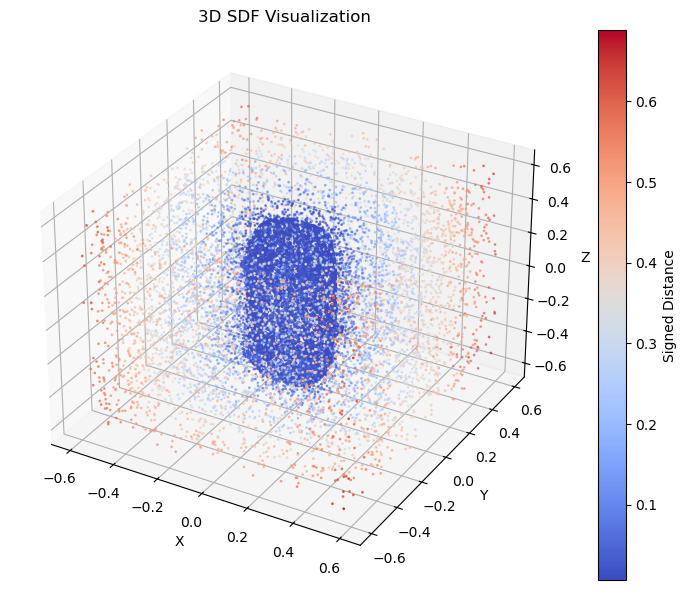

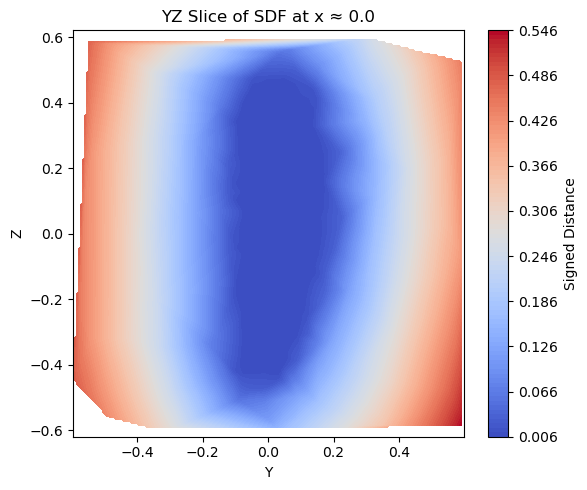

TRUTH


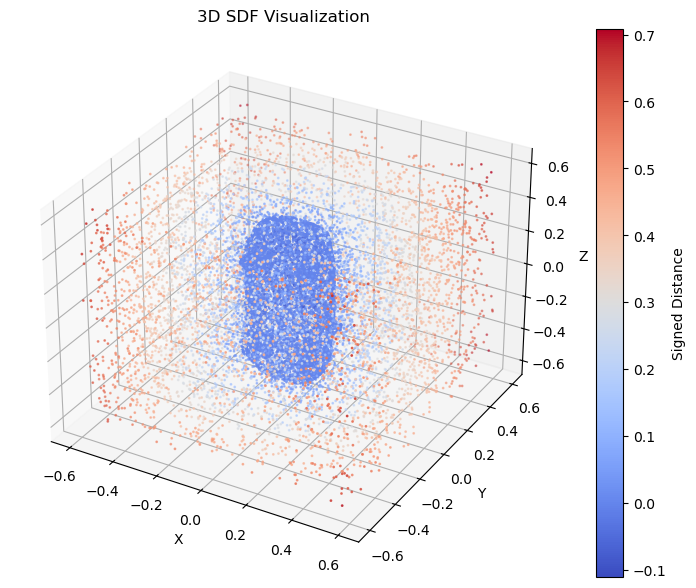

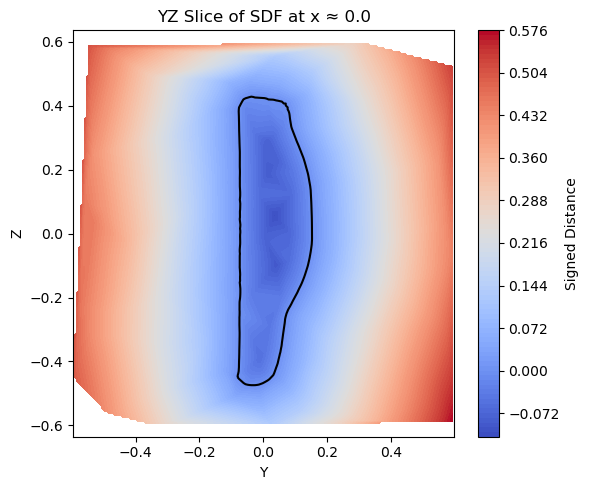

 33%|███▎      | 500/1500 [1:41:23<3:29:07, 12.55s/it]

Validation Loss: 0.0005838409415446222


 33%|███▎      | 501/1500 [1:41:35<3:26:27, 12.40s/it]

 33%|███▎      | 502/1500 [1:41:47<3:24:47, 12.31s/it]

 34%|███▎      | 503/1500 [1:41:59<3:23:45, 12.26s/it]

 34%|███▎      | 504/1500 [1:42:11<3:22:42, 12.21s/it]

 34%|███▎      | 505/1500 [1:42:23<3:21:50, 12.17s/it]

 34%|███▎      | 506/1500 [1:42:35<3:20:59, 12.13s/it]

 34%|███▍      | 507/1500 [1:42:47<3:20:29, 12.11s/it]

 34%|███▍      | 508/1500 [1:42:59<3:20:00, 12.10s/it]

 34%|███▍      | 509/1500 [1:43:11<3:19:24, 12.07s/it]

 34%|███▍      | 510/1500 [1:43:24<3:19:35, 12.10s/it]

 34%|███▍      | 511/1500 [1:43:36<3:19:33, 12.11s/it]

 34%|███▍      | 512/1500 [1:43:48<3:19:08, 12.09s/it]

 34%|███▍      | 513/1500 [1:44:00<3:18:49, 12.09s/it]

 34%|███▍      | 514/1500 [1:44:12<3:18:36, 12.09s/it]

 34%|███▍      | 515/1500 [1:44:24<3:18:08, 12.07s/it]

 34%|███▍      | 516/1500 [1:44:36<3:18:00, 12.07s/it]

 34%|███▍      | 517/1500 [1:44:48<3:18:16, 12.10s/it]

 35%|███▍      | 518/1500 [1:45:00<3:18:18, 12.12s/it]

 35%|███▍      | 519/1500 [1:45:13<3:18:07, 12.12s/it]

 35%|███▍      | 520/1500 [1:45:25<3:18:29, 12.15s/it]

Loss: 0.0012


 35%|███▍      | 521/1500 [1:45:37<3:18:10, 12.15s/it]

 35%|███▍      | 522/1500 [1:45:49<3:18:17, 12.17s/it]

 35%|███▍      | 523/1500 [1:46:01<3:17:49, 12.15s/it]

 35%|███▍      | 524/1500 [1:46:13<3:17:33, 12.14s/it]

 35%|███▌      | 525/1500 [1:46:26<3:17:18, 12.14s/it]

 35%|███▌      | 526/1500 [1:46:38<3:17:09, 12.15s/it]

 35%|███▌      | 527/1500 [1:46:50<3:16:54, 12.14s/it]

 35%|███▌      | 528/1500 [1:47:02<3:16:23, 12.12s/it]

 35%|███▌      | 529/1500 [1:47:14<3:16:16, 12.13s/it]

 35%|███▌      | 530/1500 [1:47:26<3:16:21, 12.15s/it]

 35%|███▌      | 531/1500 [1:47:38<3:16:23, 12.16s/it]

 35%|███▌      | 532/1500 [1:47:51<3:16:31, 12.18s/it]

 36%|███▌      | 533/1500 [1:48:03<3:16:27, 12.19s/it]

 36%|███▌      | 534/1500 [1:48:15<3:16:16, 12.19s/it]

 36%|███▌      | 535/1500 [1:48:27<3:16:33, 12.22s/it]

 36%|███▌      | 536/1500 [1:48:39<3:15:58, 12.20s/it]

 36%|███▌      | 537/1500 [1:48:52<3:15:34, 12.19s/it]

 36%|███▌      | 538/1500 [1:49:04<3:15:22, 12.19s/it]

 36%|███▌      | 539/1500 [1:49:16<3:15:06, 12.18s/it]

 36%|███▌      | 540/1500 [1:49:28<3:14:50, 12.18s/it]

Loss: 0.0015


 36%|███▌      | 541/1500 [1:49:40<3:14:53, 12.19s/it]

 36%|███▌      | 542/1500 [1:49:53<3:14:27, 12.18s/it]

 36%|███▌      | 543/1500 [1:50:05<3:13:56, 12.16s/it]

 36%|███▋      | 544/1500 [1:50:17<3:13:47, 12.16s/it]

 36%|███▋      | 545/1500 [1:50:29<3:13:43, 12.17s/it]

 36%|███▋      | 546/1500 [1:50:41<3:13:30, 12.17s/it]

 36%|███▋      | 547/1500 [1:50:53<3:13:38, 12.19s/it]

 37%|███▋      | 548/1500 [1:51:06<3:13:21, 12.19s/it]

 37%|███▋      | 549/1500 [1:51:18<3:13:08, 12.19s/it]

 37%|███▋      | 550/1500 [1:51:30<3:12:45, 12.17s/it]

 37%|███▋      | 551/1500 [1:51:42<3:12:09, 12.15s/it]

 37%|███▋      | 552/1500 [1:51:54<3:12:00, 12.15s/it]

 37%|███▋      | 553/1500 [1:52:06<3:12:06, 12.17s/it]

 37%|███▋      | 554/1500 [1:52:19<3:11:44, 12.16s/it]

 37%|███▋      | 555/1500 [1:52:31<3:11:09, 12.14s/it]

 37%|███▋      | 556/1500 [1:52:43<3:10:30, 12.11s/it]

 37%|███▋      | 557/1500 [1:52:55<3:10:12, 12.10s/it]

 37%|███▋      | 558/1500 [1:53:07<3:10:05, 12.11s/it]

 37%|███▋      | 559/1500 [1:53:19<3:10:10, 12.13s/it]

 37%|███▋      | 560/1500 [1:53:31<3:10:02, 12.13s/it]

Loss: 0.0013


 37%|███▋      | 561/1500 [1:53:43<3:09:57, 12.14s/it]

 37%|███▋      | 562/1500 [1:53:55<3:09:38, 12.13s/it]

 38%|███▊      | 563/1500 [1:54:08<3:09:23, 12.13s/it]

 38%|███▊      | 564/1500 [1:54:20<3:09:08, 12.12s/it]

 38%|███▊      | 565/1500 [1:54:32<3:09:07, 12.14s/it]

 38%|███▊      | 566/1500 [1:54:44<3:09:02, 12.14s/it]

 38%|███▊      | 567/1500 [1:54:56<3:08:36, 12.13s/it]

 38%|███▊      | 568/1500 [1:55:08<3:08:25, 12.13s/it]

 38%|███▊      | 569/1500 [1:55:20<3:08:24, 12.14s/it]

 38%|███▊      | 570/1500 [1:55:33<3:08:10, 12.14s/it]

 38%|███▊      | 571/1500 [1:55:45<3:07:30, 12.11s/it]

 38%|███▊      | 572/1500 [1:55:57<3:07:32, 12.13s/it]

 38%|███▊      | 573/1500 [1:56:09<3:07:36, 12.14s/it]

 38%|███▊      | 574/1500 [1:56:21<3:07:41, 12.16s/it]

 38%|███▊      | 575/1500 [1:56:33<3:07:32, 12.17s/it]

 38%|███▊      | 576/1500 [1:56:45<3:07:20, 12.17s/it]

 38%|███▊      | 577/1500 [1:56:58<3:06:46, 12.14s/it]

 39%|███▊      | 578/1500 [1:57:10<3:06:36, 12.14s/it]

 39%|███▊      | 579/1500 [1:57:22<3:06:31, 12.15s/it]

 39%|███▊      | 580/1500 [1:57:34<3:06:31, 12.16s/it]

Loss: 0.0017


 39%|███▊      | 581/1500 [1:57:46<3:06:19, 12.17s/it]

 39%|███▉      | 582/1500 [1:57:58<3:06:05, 12.16s/it]

 39%|███▉      | 583/1500 [1:58:11<3:06:00, 12.17s/it]

 39%|███▉      | 584/1500 [1:58:23<3:05:39, 12.16s/it]

 39%|███▉      | 585/1500 [1:58:35<3:05:36, 12.17s/it]

 39%|███▉      | 586/1500 [1:58:47<3:05:30, 12.18s/it]

 39%|███▉      | 587/1500 [1:58:59<3:05:17, 12.18s/it]

 39%|███▉      | 588/1500 [1:59:11<3:04:55, 12.17s/it]

 39%|███▉      | 589/1500 [1:59:24<3:04:44, 12.17s/it]

 39%|███▉      | 590/1500 [1:59:36<3:04:32, 12.17s/it]

 39%|███▉      | 591/1500 [1:59:48<3:04:10, 12.16s/it]

 39%|███▉      | 592/1500 [2:00:00<3:04:03, 12.16s/it]

 40%|███▉      | 593/1500 [2:00:12<3:03:49, 12.16s/it]

 40%|███▉      | 594/1500 [2:00:24<3:03:35, 12.16s/it]

 40%|███▉      | 595/1500 [2:00:37<3:03:34, 12.17s/it]

 40%|███▉      | 596/1500 [2:00:49<3:03:24, 12.17s/it]

 40%|███▉      | 597/1500 [2:01:01<3:03:08, 12.17s/it]

 40%|███▉      | 598/1500 [2:01:13<3:03:03, 12.18s/it]

 40%|███▉      | 599/1500 [2:01:25<3:02:51, 12.18s/it]

Loss: 0.0010


MODEL


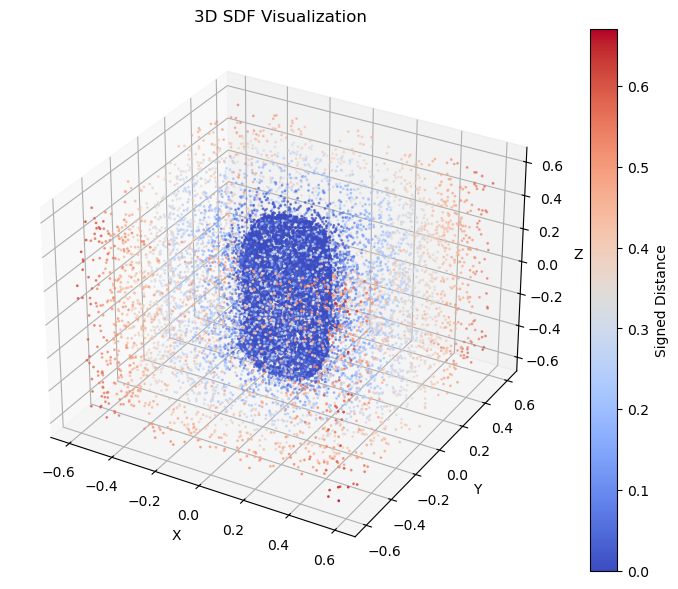

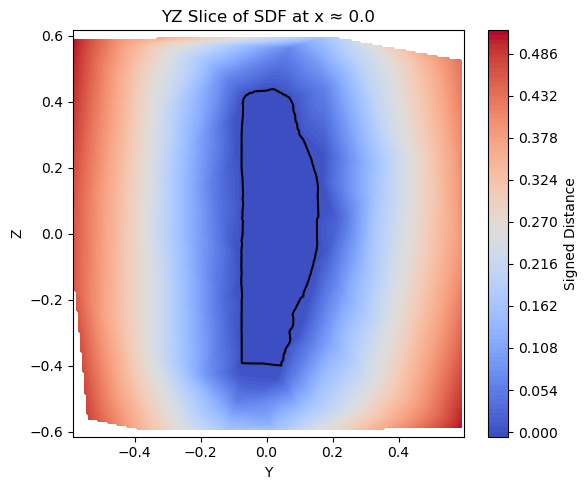

TRUTH


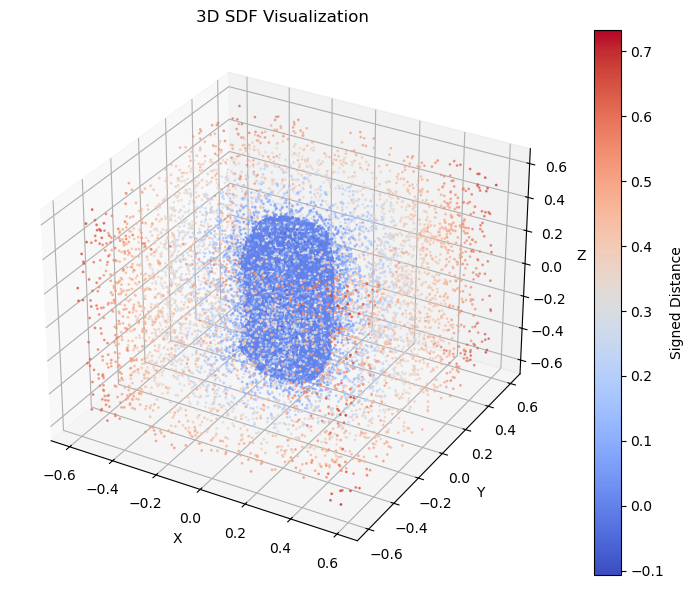

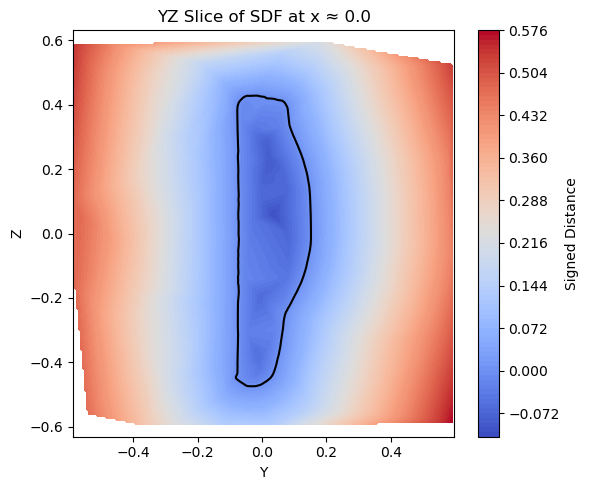

 40%|████      | 600/1500 [2:01:39<3:10:32, 12.70s/it]

Validation Loss: 0.000784781645052135


 40%|████      | 601/1500 [2:01:51<3:07:59, 12.55s/it]

 40%|████      | 602/1500 [2:02:04<3:06:06, 12.43s/it]

 40%|████      | 603/1500 [2:02:16<3:04:44, 12.36s/it]

 40%|████      | 604/1500 [2:02:28<3:03:42, 12.30s/it]

 40%|████      | 605/1500 [2:02:40<3:02:53, 12.26s/it]

 40%|████      | 606/1500 [2:02:52<3:02:17, 12.23s/it]

 40%|████      | 607/1500 [2:03:04<3:01:59, 12.23s/it]

 41%|████      | 608/1500 [2:03:17<3:01:37, 12.22s/it]

 41%|████      | 609/1500 [2:03:29<3:01:06, 12.20s/it]

 41%|████      | 610/1500 [2:03:41<3:01:01, 12.20s/it]

 41%|████      | 611/1500 [2:03:53<3:00:34, 12.19s/it]

 41%|████      | 612/1500 [2:04:05<3:00:11, 12.18s/it]

 41%|████      | 613/1500 [2:04:17<2:59:58, 12.17s/it]

 41%|████      | 614/1500 [2:04:30<2:59:36, 12.16s/it]

 41%|████      | 615/1500 [2:04:42<2:59:16, 12.15s/it]

 41%|████      | 616/1500 [2:04:54<2:59:12, 12.16s/it]

 41%|████      | 617/1500 [2:05:06<2:59:00, 12.16s/it]

 41%|████      | 618/1500 [2:05:18<2:58:41, 12.16s/it]

 41%|████▏     | 619/1500 [2:05:30<2:58:36, 12.16s/it]

 41%|████▏     | 620/1500 [2:05:43<2:58:20, 12.16s/it]

Loss: 0.0017


 41%|████▏     | 621/1500 [2:05:55<2:58:07, 12.16s/it]

 41%|████▏     | 622/1500 [2:06:07<2:58:02, 12.17s/it]

 42%|████▏     | 623/1500 [2:06:19<2:57:45, 12.16s/it]

 42%|████▏     | 624/1500 [2:06:31<2:57:24, 12.15s/it]

 42%|████▏     | 625/1500 [2:06:43<2:57:18, 12.16s/it]

 42%|████▏     | 626/1500 [2:06:56<2:57:07, 12.16s/it]

 42%|████▏     | 627/1500 [2:07:08<2:56:58, 12.16s/it]

 42%|████▏     | 628/1500 [2:07:20<2:56:53, 12.17s/it]

 42%|████▏     | 629/1500 [2:07:32<2:56:38, 12.17s/it]

 42%|████▏     | 630/1500 [2:07:44<2:56:32, 12.18s/it]

 42%|████▏     | 631/1500 [2:07:56<2:56:24, 12.18s/it]

 42%|████▏     | 632/1500 [2:08:09<2:56:03, 12.17s/it]

 42%|████▏     | 633/1500 [2:08:21<2:55:48, 12.17s/it]

 42%|████▏     | 634/1500 [2:08:33<2:55:46, 12.18s/it]

 42%|████▏     | 635/1500 [2:08:45<2:55:30, 12.17s/it]

 42%|████▏     | 636/1500 [2:08:57<2:55:19, 12.17s/it]

 42%|████▏     | 637/1500 [2:09:09<2:55:16, 12.19s/it]

 43%|████▎     | 638/1500 [2:09:22<2:54:56, 12.18s/it]

 43%|████▎     | 639/1500 [2:09:34<2:54:42, 12.17s/it]

 43%|████▎     | 640/1500 [2:09:46<2:54:37, 12.18s/it]

Loss: 0.0020


 43%|████▎     | 641/1500 [2:09:58<2:54:24, 12.18s/it]

 43%|████▎     | 642/1500 [2:10:10<2:54:09, 12.18s/it]

 43%|████▎     | 643/1500 [2:10:23<2:54:07, 12.19s/it]

 43%|████▎     | 644/1500 [2:10:35<2:53:45, 12.18s/it]

 43%|████▎     | 645/1500 [2:10:47<2:53:33, 12.18s/it]

 43%|████▎     | 646/1500 [2:10:59<2:53:24, 12.18s/it]

 43%|████▎     | 647/1500 [2:11:11<2:53:03, 12.17s/it]

 43%|████▎     | 648/1500 [2:11:23<2:52:53, 12.18s/it]

 43%|████▎     | 649/1500 [2:11:36<2:52:48, 12.18s/it]

 43%|████▎     | 650/1500 [2:11:48<2:52:28, 12.17s/it]

 43%|████▎     | 651/1500 [2:12:00<2:52:05, 12.16s/it]

 43%|████▎     | 652/1500 [2:12:12<2:52:02, 12.17s/it]

 44%|████▎     | 653/1500 [2:12:24<2:51:48, 12.17s/it]

 44%|████▎     | 654/1500 [2:12:36<2:51:38, 12.17s/it]

 44%|████▎     | 655/1500 [2:12:49<2:51:35, 12.18s/it]

 44%|████▎     | 656/1500 [2:13:01<2:51:19, 12.18s/it]

 44%|████▍     | 657/1500 [2:13:13<2:51:37, 12.22s/it]

 44%|████▍     | 658/1500 [2:13:25<2:51:22, 12.21s/it]

 44%|████▍     | 659/1500 [2:13:37<2:50:51, 12.19s/it]

 44%|████▍     | 660/1500 [2:13:50<2:50:33, 12.18s/it]

Loss: 0.0078


 44%|████▍     | 661/1500 [2:14:02<2:50:27, 12.19s/it]

 44%|████▍     | 662/1500 [2:14:14<2:50:18, 12.19s/it]

 44%|████▍     | 663/1500 [2:14:26<2:50:04, 12.19s/it]

 44%|████▍     | 664/1500 [2:14:38<2:49:58, 12.20s/it]

 44%|████▍     | 665/1500 [2:14:51<2:49:42, 12.19s/it]

 44%|████▍     | 666/1500 [2:15:03<2:49:26, 12.19s/it]

 44%|████▍     | 667/1500 [2:15:15<2:49:21, 12.20s/it]

 45%|████▍     | 668/1500 [2:15:27<2:49:07, 12.20s/it]

 45%|████▍     | 669/1500 [2:15:39<2:48:53, 12.19s/it]

 45%|████▍     | 670/1500 [2:15:52<2:48:32, 12.18s/it]

 45%|████▍     | 671/1500 [2:16:04<2:48:16, 12.18s/it]

 45%|████▍     | 672/1500 [2:16:16<2:47:57, 12.17s/it]

 45%|████▍     | 673/1500 [2:16:28<2:47:52, 12.18s/it]

 45%|████▍     | 674/1500 [2:16:40<2:47:40, 12.18s/it]

 45%|████▌     | 675/1500 [2:16:52<2:47:18, 12.17s/it]

 45%|████▌     | 676/1500 [2:17:05<2:47:11, 12.17s/it]

 45%|████▌     | 677/1500 [2:17:17<2:46:58, 12.17s/it]

 45%|████▌     | 678/1500 [2:17:29<2:46:43, 12.17s/it]

 45%|████▌     | 679/1500 [2:17:41<2:46:39, 12.18s/it]

 45%|████▌     | 680/1500 [2:17:53<2:46:24, 12.18s/it]

Loss: 0.0017


 45%|████▌     | 681/1500 [2:18:05<2:46:08, 12.17s/it]

 45%|████▌     | 682/1500 [2:18:18<2:46:05, 12.18s/it]

 46%|████▌     | 683/1500 [2:18:30<2:45:46, 12.17s/it]

 46%|████▌     | 684/1500 [2:18:42<2:45:32, 12.17s/it]

 46%|████▌     | 685/1500 [2:18:54<2:45:20, 12.17s/it]

 46%|████▌     | 686/1500 [2:19:06<2:45:01, 12.16s/it]

 46%|████▌     | 687/1500 [2:19:19<2:45:28, 12.21s/it]

 46%|████▌     | 688/1500 [2:19:31<2:45:08, 12.20s/it]

 46%|████▌     | 689/1500 [2:19:43<2:44:55, 12.20s/it]

 46%|████▌     | 690/1500 [2:19:55<2:44:38, 12.20s/it]

 46%|████▌     | 691/1500 [2:20:07<2:44:25, 12.20s/it]

 46%|████▌     | 692/1500 [2:20:20<2:43:59, 12.18s/it]

 46%|████▌     | 693/1500 [2:20:32<2:43:45, 12.18s/it]

 46%|████▋     | 694/1500 [2:20:44<2:43:44, 12.19s/it]

 46%|████▋     | 695/1500 [2:20:56<2:43:17, 12.17s/it]

 46%|████▋     | 696/1500 [2:21:08<2:42:53, 12.16s/it]

 46%|████▋     | 697/1500 [2:21:20<2:42:44, 12.16s/it]

 47%|████▋     | 698/1500 [2:21:33<2:42:30, 12.16s/it]

 47%|████▋     | 699/1500 [2:21:45<2:42:19, 12.16s/it]

Loss: 0.0014


MODEL


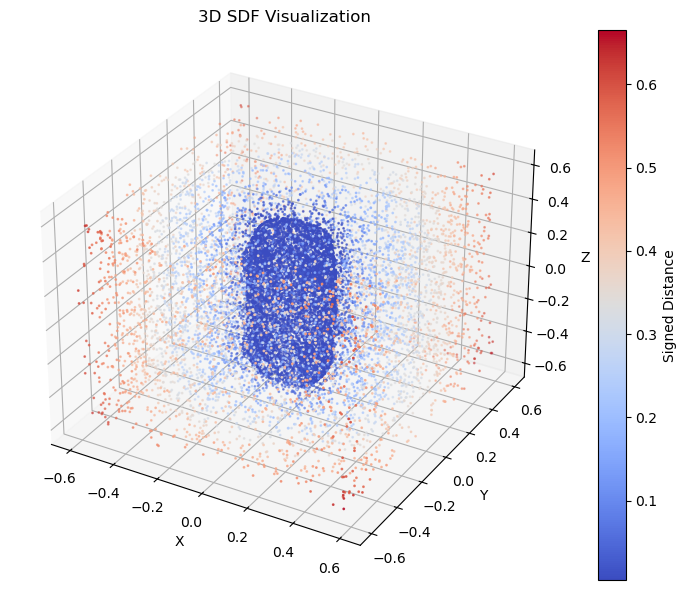

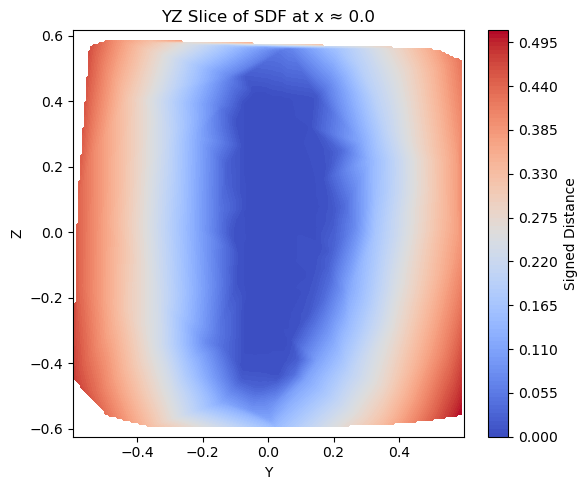

TRUTH


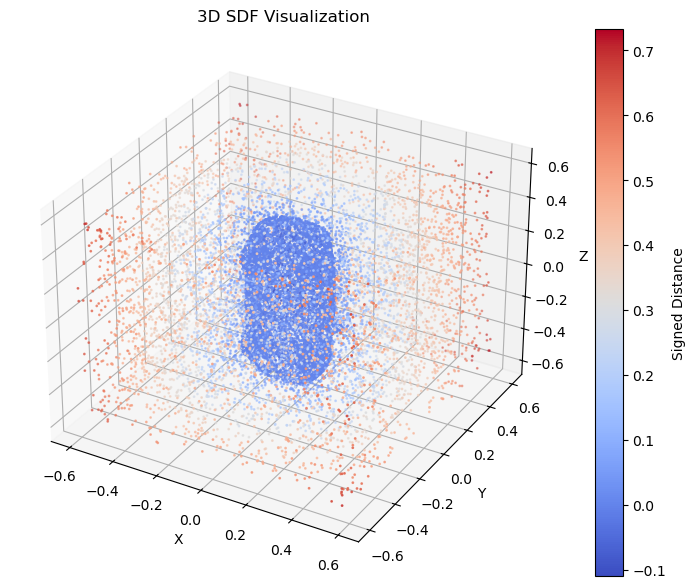

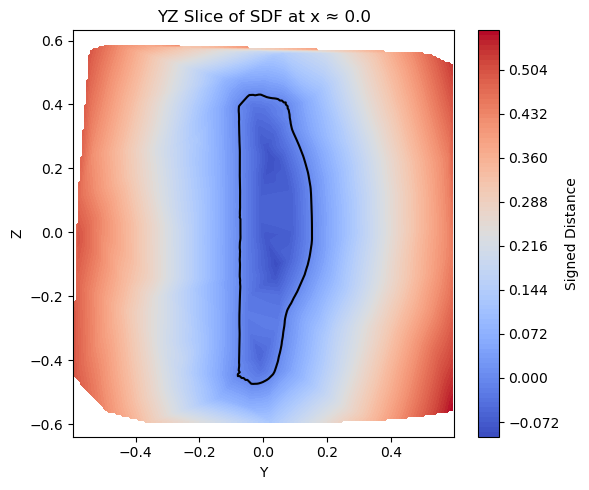

 47%|████▋     | 700/1500 [2:21:58<2:48:21, 12.63s/it]

Validation Loss: 0.0008934964425861835


 47%|████▋     | 701/1500 [2:22:11<2:46:17, 12.49s/it]

 47%|████▋     | 702/1500 [2:22:23<2:44:55, 12.40s/it]

 47%|████▋     | 703/1500 [2:22:35<2:44:05, 12.35s/it]

 47%|████▋     | 704/1500 [2:22:47<2:43:08, 12.30s/it]

 47%|████▋     | 705/1500 [2:22:59<2:42:28, 12.26s/it]

 47%|████▋     | 706/1500 [2:23:12<2:41:59, 12.24s/it]

 47%|████▋     | 707/1500 [2:23:24<2:41:34, 12.22s/it]

 47%|████▋     | 708/1500 [2:23:36<2:41:10, 12.21s/it]

 47%|████▋     | 709/1500 [2:23:48<2:40:49, 12.20s/it]

 47%|████▋     | 710/1500 [2:24:00<2:40:25, 12.18s/it]

 47%|████▋     | 711/1500 [2:24:12<2:40:10, 12.18s/it]

 47%|████▋     | 712/1500 [2:24:25<2:40:07, 12.19s/it]

 48%|████▊     | 713/1500 [2:24:37<2:39:47, 12.18s/it]

 48%|████▊     | 714/1500 [2:24:49<2:39:28, 12.17s/it]

 48%|████▊     | 715/1500 [2:25:01<2:39:23, 12.18s/it]

 48%|████▊     | 716/1500 [2:25:13<2:39:01, 12.17s/it]

 48%|████▊     | 717/1500 [2:25:25<2:38:45, 12.17s/it]

 48%|████▊     | 718/1500 [2:25:38<2:38:15, 12.14s/it]

 48%|████▊     | 719/1500 [2:25:50<2:37:46, 12.12s/it]

 48%|████▊     | 720/1500 [2:26:02<2:37:39, 12.13s/it]

Loss: 0.0015


 48%|████▊     | 721/1500 [2:26:14<2:37:46, 12.15s/it]

 48%|████▊     | 722/1500 [2:26:26<2:37:28, 12.14s/it]

 48%|████▊     | 723/1500 [2:26:38<2:37:03, 12.13s/it]

 48%|████▊     | 724/1500 [2:26:50<2:37:06, 12.15s/it]

 48%|████▊     | 725/1500 [2:27:03<2:36:59, 12.15s/it]

 48%|████▊     | 726/1500 [2:27:15<2:36:43, 12.15s/it]

 48%|████▊     | 727/1500 [2:27:27<2:36:48, 12.17s/it]

 49%|████▊     | 728/1500 [2:27:39<2:36:32, 12.17s/it]

 49%|████▊     | 729/1500 [2:27:51<2:36:19, 12.17s/it]

 49%|████▊     | 730/1500 [2:28:03<2:36:20, 12.18s/it]

 49%|████▊     | 731/1500 [2:28:16<2:36:01, 12.17s/it]

 49%|████▉     | 732/1500 [2:28:28<2:35:37, 12.16s/it]

 49%|████▉     | 733/1500 [2:28:40<2:35:24, 12.16s/it]

 49%|████▉     | 734/1500 [2:28:52<2:35:04, 12.15s/it]

 49%|████▉     | 735/1500 [2:29:04<2:34:46, 12.14s/it]

 49%|████▉     | 736/1500 [2:29:16<2:34:43, 12.15s/it]

 49%|████▉     | 737/1500 [2:29:28<2:34:30, 12.15s/it]

 49%|████▉     | 738/1500 [2:29:41<2:34:21, 12.15s/it]

 49%|████▉     | 739/1500 [2:29:53<2:34:20, 12.17s/it]

 49%|████▉     | 740/1500 [2:30:05<2:34:07, 12.17s/it]

Loss: 0.0021


 49%|████▉     | 741/1500 [2:30:17<2:33:46, 12.16s/it]

 49%|████▉     | 742/1500 [2:30:29<2:33:42, 12.17s/it]

 50%|████▉     | 743/1500 [2:30:41<2:33:21, 12.16s/it]

 50%|████▉     | 744/1500 [2:30:54<2:33:10, 12.16s/it]

 50%|████▉     | 745/1500 [2:31:06<2:33:07, 12.17s/it]

 50%|████▉     | 746/1500 [2:31:18<2:32:50, 12.16s/it]

 50%|████▉     | 747/1500 [2:31:30<2:32:39, 12.16s/it]

 50%|████▉     | 748/1500 [2:31:42<2:32:31, 12.17s/it]

 50%|████▉     | 749/1500 [2:31:54<2:32:17, 12.17s/it]

 50%|█████     | 750/1500 [2:32:07<2:32:01, 12.16s/it]

 50%|█████     | 751/1500 [2:32:19<2:31:46, 12.16s/it]

 50%|█████     | 752/1500 [2:32:31<2:31:34, 12.16s/it]

 50%|█████     | 753/1500 [2:32:43<2:31:24, 12.16s/it]

 50%|█████     | 754/1500 [2:32:55<2:31:21, 12.17s/it]

 50%|█████     | 755/1500 [2:33:07<2:31:04, 12.17s/it]

 50%|█████     | 756/1500 [2:33:20<2:30:50, 12.16s/it]

 50%|█████     | 757/1500 [2:33:32<2:30:44, 12.17s/it]

 51%|█████     | 758/1500 [2:33:44<2:30:37, 12.18s/it]

 51%|█████     | 759/1500 [2:33:56<2:30:21, 12.18s/it]

 51%|█████     | 760/1500 [2:34:08<2:30:13, 12.18s/it]

Loss: 0.0019


 51%|█████     | 761/1500 [2:34:20<2:29:58, 12.18s/it]

 51%|█████     | 762/1500 [2:34:33<2:29:49, 12.18s/it]

 51%|█████     | 763/1500 [2:34:45<2:29:51, 12.20s/it]

 51%|█████     | 764/1500 [2:34:57<2:29:36, 12.20s/it]

 51%|█████     | 765/1500 [2:35:09<2:29:23, 12.20s/it]

 51%|█████     | 766/1500 [2:35:22<2:29:17, 12.20s/it]

 51%|█████     | 767/1500 [2:35:34<2:29:10, 12.21s/it]

 51%|█████     | 768/1500 [2:35:46<2:28:55, 12.21s/it]

 51%|█████▏    | 769/1500 [2:35:58<2:28:43, 12.21s/it]

 51%|█████▏    | 770/1500 [2:36:10<2:28:23, 12.20s/it]

 51%|█████▏    | 771/1500 [2:36:22<2:27:59, 12.18s/it]

 51%|█████▏    | 772/1500 [2:36:35<2:27:53, 12.19s/it]

 52%|█████▏    | 773/1500 [2:36:47<2:27:38, 12.18s/it]

 52%|█████▏    | 774/1500 [2:36:59<2:27:27, 12.19s/it]

 52%|█████▏    | 775/1500 [2:37:11<2:27:14, 12.18s/it]

 52%|█████▏    | 776/1500 [2:37:23<2:27:00, 12.18s/it]

 52%|█████▏    | 777/1500 [2:37:36<2:26:50, 12.19s/it]

 52%|█████▏    | 778/1500 [2:37:48<2:26:54, 12.21s/it]

 52%|█████▏    | 779/1500 [2:38:00<2:26:40, 12.21s/it]

 52%|█████▏    | 780/1500 [2:38:12<2:26:10, 12.18s/it]

Loss: 0.0013


 52%|█████▏    | 781/1500 [2:38:24<2:26:03, 12.19s/it]

 52%|█████▏    | 782/1500 [2:38:37<2:25:51, 12.19s/it]

 52%|█████▏    | 783/1500 [2:38:49<2:25:33, 12.18s/it]

 52%|█████▏    | 784/1500 [2:39:01<2:25:27, 12.19s/it]

 52%|█████▏    | 785/1500 [2:39:13<2:25:13, 12.19s/it]

 52%|█████▏    | 786/1500 [2:39:25<2:24:59, 12.18s/it]

 52%|█████▏    | 787/1500 [2:39:38<2:24:57, 12.20s/it]

 53%|█████▎    | 788/1500 [2:39:50<2:24:34, 12.18s/it]

 53%|█████▎    | 789/1500 [2:40:02<2:24:20, 12.18s/it]

 53%|█████▎    | 790/1500 [2:40:14<2:24:21, 12.20s/it]

 53%|█████▎    | 791/1500 [2:40:26<2:24:05, 12.19s/it]

 53%|█████▎    | 792/1500 [2:40:38<2:23:45, 12.18s/it]

 53%|█████▎    | 793/1500 [2:40:51<2:23:49, 12.21s/it]

 53%|█████▎    | 794/1500 [2:41:03<2:23:29, 12.19s/it]

 53%|█████▎    | 795/1500 [2:41:15<2:23:08, 12.18s/it]

 53%|█████▎    | 796/1500 [2:41:27<2:22:58, 12.19s/it]

 53%|█████▎    | 797/1500 [2:41:39<2:22:33, 12.17s/it]

 53%|█████▎    | 798/1500 [2:41:51<2:22:19, 12.16s/it]

 53%|█████▎    | 799/1500 [2:42:04<2:22:12, 12.17s/it]

Loss: 0.0013


MODEL


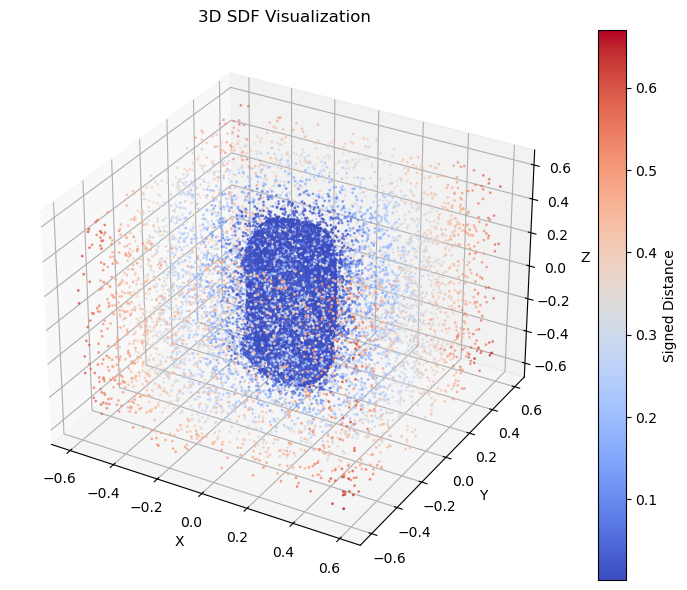

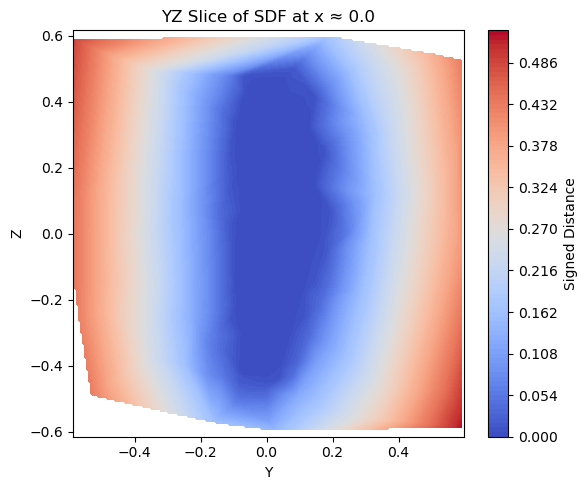

TRUTH


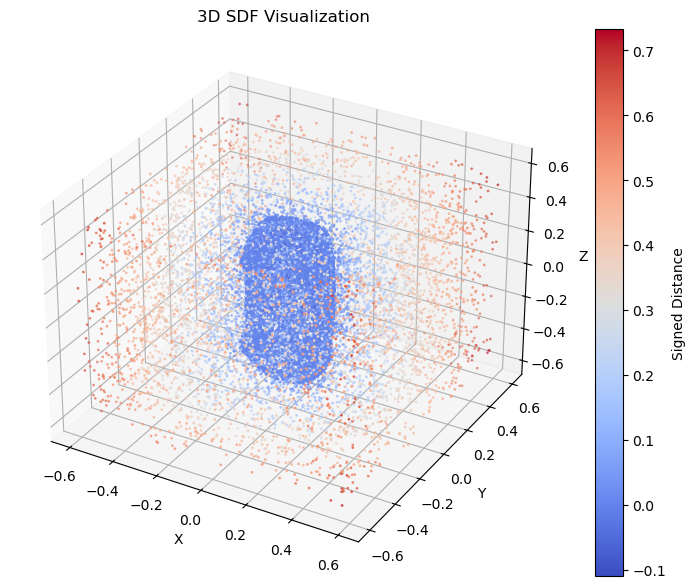

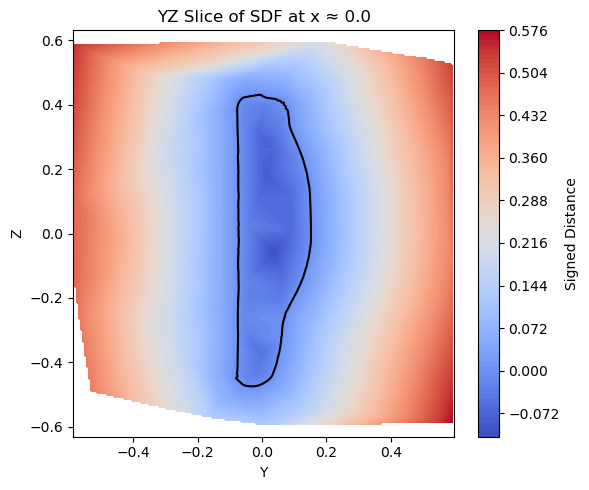

 53%|█████▎    | 800/1500 [2:42:17<2:27:05, 12.61s/it]

Validation Loss: 0.0008941944688558578


 53%|█████▎    | 801/1500 [2:42:30<2:25:28, 12.49s/it]

 53%|█████▎    | 802/1500 [2:42:42<2:24:25, 12.42s/it]

 54%|█████▎    | 803/1500 [2:42:54<2:23:31, 12.35s/it]

 54%|█████▎    | 804/1500 [2:43:06<2:22:46, 12.31s/it]

 54%|█████▎    | 805/1500 [2:43:18<2:22:18, 12.29s/it]

 54%|█████▎    | 806/1500 [2:43:31<2:21:49, 12.26s/it]

 54%|█████▍    | 807/1500 [2:43:43<2:21:27, 12.25s/it]

 54%|█████▍    | 808/1500 [2:43:55<2:21:10, 12.24s/it]

 54%|█████▍    | 809/1500 [2:44:07<2:20:45, 12.22s/it]

 54%|█████▍    | 810/1500 [2:44:19<2:20:28, 12.21s/it]

 54%|█████▍    | 811/1500 [2:44:32<2:20:18, 12.22s/it]

 54%|█████▍    | 812/1500 [2:44:44<2:20:01, 12.21s/it]

 54%|█████▍    | 813/1500 [2:44:56<2:19:50, 12.21s/it]

 54%|█████▍    | 814/1500 [2:45:08<2:19:45, 12.22s/it]

 54%|█████▍    | 815/1500 [2:45:21<2:19:26, 12.21s/it]

 54%|█████▍    | 816/1500 [2:45:33<2:19:08, 12.21s/it]

 54%|█████▍    | 817/1500 [2:45:45<2:19:06, 12.22s/it]

 55%|█████▍    | 818/1500 [2:45:57<2:18:40, 12.20s/it]

 55%|█████▍    | 819/1500 [2:46:09<2:18:26, 12.20s/it]

 55%|█████▍    | 820/1500 [2:46:22<2:18:29, 12.22s/it]

Loss: 0.0015


 55%|█████▍    | 821/1500 [2:46:34<2:18:11, 12.21s/it]

 55%|█████▍    | 822/1500 [2:46:46<2:17:53, 12.20s/it]

 55%|█████▍    | 823/1500 [2:46:58<2:17:47, 12.21s/it]

 55%|█████▍    | 824/1500 [2:47:10<2:17:34, 12.21s/it]

 55%|█████▌    | 825/1500 [2:47:23<2:17:22, 12.21s/it]

 55%|█████▌    | 826/1500 [2:47:35<2:17:19, 12.22s/it]

 55%|█████▌    | 827/1500 [2:47:47<2:17:08, 12.23s/it]

 55%|█████▌    | 828/1500 [2:47:59<2:16:51, 12.22s/it]

 55%|█████▌    | 829/1500 [2:48:12<2:16:49, 12.24s/it]

 55%|█████▌    | 830/1500 [2:48:24<2:16:33, 12.23s/it]

 55%|█████▌    | 831/1500 [2:48:36<2:16:11, 12.21s/it]

 55%|█████▌    | 832/1500 [2:48:48<2:16:08, 12.23s/it]

 56%|█████▌    | 833/1500 [2:49:00<2:15:48, 12.22s/it]

 56%|█████▌    | 834/1500 [2:49:13<2:15:29, 12.21s/it]

 56%|█████▌    | 835/1500 [2:49:25<2:15:23, 12.22s/it]

 56%|█████▌    | 836/1500 [2:49:37<2:15:10, 12.21s/it]

 56%|█████▌    | 837/1500 [2:49:49<2:14:55, 12.21s/it]

 56%|█████▌    | 838/1500 [2:50:01<2:14:40, 12.21s/it]

 56%|█████▌    | 839/1500 [2:50:14<2:14:25, 12.20s/it]

 56%|█████▌    | 840/1500 [2:50:26<2:14:07, 12.19s/it]

Loss: 0.0014


 56%|█████▌    | 841/1500 [2:50:38<2:14:09, 12.21s/it]

 56%|█████▌    | 842/1500 [2:50:50<2:13:57, 12.21s/it]

 56%|█████▌    | 843/1500 [2:51:02<2:13:38, 12.20s/it]

 56%|█████▋    | 844/1500 [2:51:15<2:13:36, 12.22s/it]

 56%|█████▋    | 845/1500 [2:51:27<2:13:18, 12.21s/it]

 56%|█████▋    | 846/1500 [2:51:39<2:13:06, 12.21s/it]

 56%|█████▋    | 847/1500 [2:51:51<2:12:56, 12.22s/it]

 57%|█████▋    | 848/1500 [2:52:04<2:12:35, 12.20s/it]

 57%|█████▋    | 849/1500 [2:52:16<2:12:19, 12.20s/it]

 57%|█████▋    | 850/1500 [2:52:28<2:12:13, 12.20s/it]

 57%|█████▋    | 851/1500 [2:52:40<2:11:52, 12.19s/it]

 57%|█████▋    | 852/1500 [2:52:52<2:11:40, 12.19s/it]

 57%|█████▋    | 853/1500 [2:53:05<2:11:41, 12.21s/it]

 57%|█████▋    | 854/1500 [2:53:17<2:11:29, 12.21s/it]

 57%|█████▋    | 855/1500 [2:53:29<2:11:11, 12.20s/it]

 57%|█████▋    | 856/1500 [2:53:41<2:11:01, 12.21s/it]

 57%|█████▋    | 857/1500 [2:53:53<2:10:46, 12.20s/it]

 57%|█████▋    | 858/1500 [2:54:06<2:10:31, 12.20s/it]

 57%|█████▋    | 859/1500 [2:54:18<2:10:20, 12.20s/it]

 57%|█████▋    | 860/1500 [2:54:30<2:10:11, 12.21s/it]

Loss: 0.0017


 57%|█████▋    | 861/1500 [2:54:42<2:09:54, 12.20s/it]

 57%|█████▋    | 862/1500 [2:54:54<2:09:53, 12.22s/it]

 58%|█████▊    | 863/1500 [2:55:07<2:09:30, 12.20s/it]

 58%|█████▊    | 864/1500 [2:55:19<2:09:14, 12.19s/it]

 58%|█████▊    | 865/1500 [2:55:31<2:09:10, 12.21s/it]

 58%|█████▊    | 866/1500 [2:55:43<2:08:27, 12.16s/it]

 58%|█████▊    | 867/1500 [2:55:55<2:07:58, 12.13s/it]

 58%|█████▊    | 868/1500 [2:56:07<2:08:05, 12.16s/it]

 58%|█████▊    | 869/1500 [2:56:20<2:08:03, 12.18s/it]

 58%|█████▊    | 870/1500 [2:56:32<2:07:58, 12.19s/it]

 58%|█████▊    | 871/1500 [2:56:44<2:07:53, 12.20s/it]

 58%|█████▊    | 872/1500 [2:56:56<2:07:39, 12.20s/it]

 58%|█████▊    | 873/1500 [2:57:08<2:07:28, 12.20s/it]

 58%|█████▊    | 874/1500 [2:57:21<2:07:09, 12.19s/it]

 58%|█████▊    | 875/1500 [2:57:33<2:06:57, 12.19s/it]

 58%|█████▊    | 876/1500 [2:57:45<2:06:42, 12.18s/it]

 58%|█████▊    | 877/1500 [2:57:57<2:06:39, 12.20s/it]

 59%|█████▊    | 878/1500 [2:58:09<2:06:26, 12.20s/it]

 59%|█████▊    | 879/1500 [2:58:22<2:06:16, 12.20s/it]

 59%|█████▊    | 880/1500 [2:58:34<2:06:14, 12.22s/it]

Loss: 0.0014


 59%|█████▊    | 881/1500 [2:58:46<2:05:59, 12.21s/it]

 59%|█████▉    | 882/1500 [2:58:58<2:05:49, 12.22s/it]

 59%|█████▉    | 883/1500 [2:59:10<2:05:46, 12.23s/it]

 59%|█████▉    | 884/1500 [2:59:23<2:05:28, 12.22s/it]

 59%|█████▉    | 885/1500 [2:59:35<2:05:10, 12.21s/it]

 59%|█████▉    | 886/1500 [2:59:47<2:05:05, 12.22s/it]

 59%|█████▉    | 887/1500 [2:59:59<2:04:44, 12.21s/it]

 59%|█████▉    | 888/1500 [3:00:11<2:04:33, 12.21s/it]

 59%|█████▉    | 889/1500 [3:00:24<2:04:25, 12.22s/it]

 59%|█████▉    | 890/1500 [3:00:36<2:04:03, 12.20s/it]

 59%|█████▉    | 891/1500 [3:00:48<2:03:59, 12.22s/it]

 59%|█████▉    | 892/1500 [3:01:00<2:03:55, 12.23s/it]

 60%|█████▉    | 893/1500 [3:01:13<2:03:39, 12.22s/it]

 60%|█████▉    | 894/1500 [3:01:25<2:03:25, 12.22s/it]

 60%|█████▉    | 895/1500 [3:01:37<2:03:16, 12.23s/it]

 60%|█████▉    | 896/1500 [3:01:49<2:02:57, 12.21s/it]

 60%|█████▉    | 897/1500 [3:02:01<2:02:50, 12.22s/it]

 60%|█████▉    | 898/1500 [3:02:14<2:02:38, 12.22s/it]

 60%|█████▉    | 899/1500 [3:02:26<2:02:15, 12.21s/it]

Loss: 0.0011


MODEL


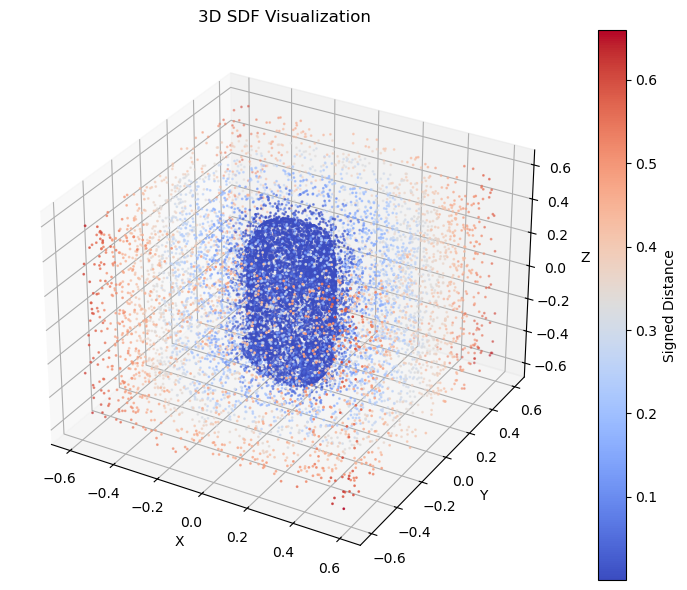

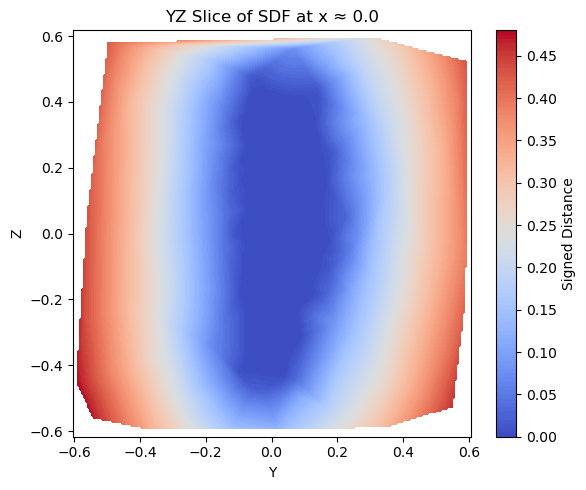

TRUTH


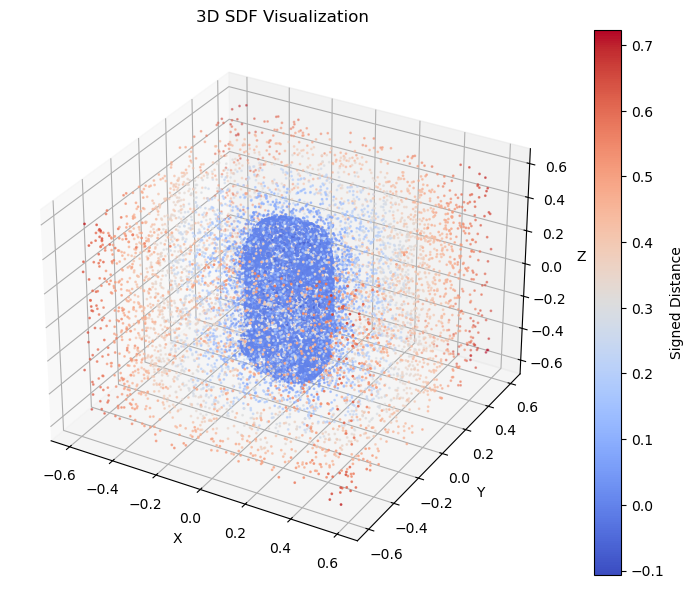

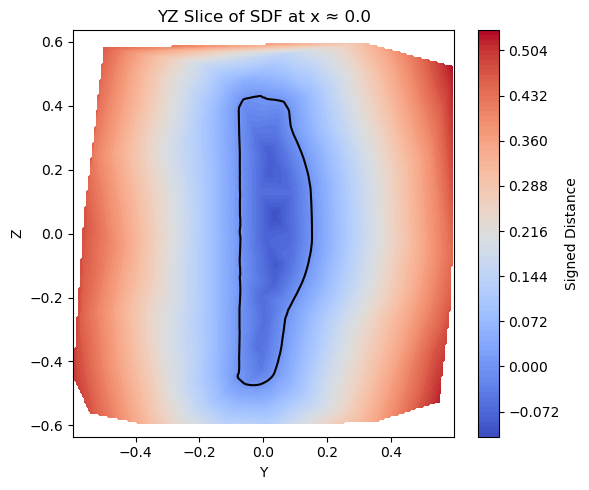

 60%|██████    | 900/1500 [3:02:40<2:06:39, 12.67s/it]

Validation Loss: 0.0008623938192613423


 60%|██████    | 901/1500 [3:02:52<2:05:00, 12.52s/it]

 60%|██████    | 902/1500 [3:03:04<2:03:48, 12.42s/it]

 60%|██████    | 903/1500 [3:03:16<2:02:52, 12.35s/it]

 60%|██████    | 904/1500 [3:03:28<2:02:20, 12.32s/it]

 60%|██████    | 905/1500 [3:03:41<2:01:45, 12.28s/it]

 60%|██████    | 906/1500 [3:03:53<2:01:22, 12.26s/it]

 60%|██████    | 907/1500 [3:04:05<2:01:08, 12.26s/it]

 61%|██████    | 908/1500 [3:04:17<2:00:46, 12.24s/it]

 61%|██████    | 909/1500 [3:04:29<2:00:24, 12.22s/it]

 61%|██████    | 910/1500 [3:04:42<2:00:12, 12.23s/it]

 61%|██████    | 911/1500 [3:04:54<2:00:00, 12.23s/it]

 61%|██████    | 912/1500 [3:05:06<1:59:43, 12.22s/it]

 61%|██████    | 913/1500 [3:05:18<1:59:43, 12.24s/it]

 61%|██████    | 914/1500 [3:05:31<1:59:30, 12.24s/it]

 61%|██████    | 915/1500 [3:05:43<1:59:14, 12.23s/it]

 61%|██████    | 916/1500 [3:05:55<1:59:05, 12.24s/it]

 61%|██████    | 917/1500 [3:06:07<1:58:48, 12.23s/it]

 61%|██████    | 918/1500 [3:06:19<1:58:24, 12.21s/it]

 61%|██████▏   | 919/1500 [3:06:32<1:58:14, 12.21s/it]

 61%|██████▏   | 920/1500 [3:06:44<1:57:57, 12.20s/it]

Loss: 0.0013


 61%|██████▏   | 921/1500 [3:06:56<1:57:44, 12.20s/it]

 61%|██████▏   | 922/1500 [3:07:08<1:57:35, 12.21s/it]

 62%|██████▏   | 923/1500 [3:07:20<1:57:20, 12.20s/it]

 62%|██████▏   | 924/1500 [3:07:33<1:57:06, 12.20s/it]

 62%|██████▏   | 925/1500 [3:07:45<1:57:06, 12.22s/it]

 62%|██████▏   | 926/1500 [3:07:57<1:56:52, 12.22s/it]

 62%|██████▏   | 927/1500 [3:08:09<1:56:40, 12.22s/it]

 62%|██████▏   | 928/1500 [3:08:22<1:56:31, 12.22s/it]

 62%|██████▏   | 929/1500 [3:08:34<1:56:12, 12.21s/it]

 62%|██████▏   | 930/1500 [3:08:46<1:55:58, 12.21s/it]

 62%|██████▏   | 931/1500 [3:08:58<1:55:55, 12.22s/it]

 62%|██████▏   | 932/1500 [3:09:10<1:55:30, 12.20s/it]

 62%|██████▏   | 933/1500 [3:09:23<1:55:11, 12.19s/it]

 62%|██████▏   | 934/1500 [3:09:35<1:55:01, 12.19s/it]

 62%|██████▏   | 935/1500 [3:09:47<1:54:49, 12.19s/it]

 62%|██████▏   | 936/1500 [3:09:59<1:54:35, 12.19s/it]

 62%|██████▏   | 937/1500 [3:10:11<1:54:32, 12.21s/it]

 63%|██████▎   | 938/1500 [3:10:24<1:54:17, 12.20s/it]

 63%|██████▎   | 939/1500 [3:10:36<1:54:00, 12.19s/it]

 63%|██████▎   | 940/1500 [3:10:48<1:54:02, 12.22s/it]

Loss: 0.0014


 63%|██████▎   | 941/1500 [3:11:00<1:53:45, 12.21s/it]

 63%|██████▎   | 942/1500 [3:11:12<1:53:38, 12.22s/it]

 63%|██████▎   | 943/1500 [3:11:25<1:53:32, 12.23s/it]

 63%|██████▎   | 944/1500 [3:11:37<1:53:15, 12.22s/it]

 63%|██████▎   | 945/1500 [3:11:49<1:53:02, 12.22s/it]

 63%|██████▎   | 946/1500 [3:12:01<1:52:55, 12.23s/it]

 63%|██████▎   | 947/1500 [3:12:14<1:52:33, 12.21s/it]

 63%|██████▎   | 948/1500 [3:12:26<1:52:17, 12.21s/it]

 63%|██████▎   | 949/1500 [3:12:38<1:52:20, 12.23s/it]

 63%|██████▎   | 950/1500 [3:12:50<1:52:07, 12.23s/it]

 63%|██████▎   | 951/1500 [3:13:02<1:51:53, 12.23s/it]

 63%|██████▎   | 952/1500 [3:13:15<1:51:45, 12.24s/it]

 64%|██████▎   | 953/1500 [3:13:27<1:51:27, 12.23s/it]

 64%|██████▎   | 954/1500 [3:13:39<1:51:08, 12.21s/it]

 64%|██████▎   | 955/1500 [3:13:51<1:50:59, 12.22s/it]

 64%|██████▎   | 956/1500 [3:14:04<1:50:41, 12.21s/it]

 64%|██████▍   | 957/1500 [3:14:16<1:50:35, 12.22s/it]

 64%|██████▍   | 958/1500 [3:14:28<1:50:23, 12.22s/it]

 64%|██████▍   | 959/1500 [3:14:40<1:50:06, 12.21s/it]

 64%|██████▍   | 960/1500 [3:14:52<1:49:50, 12.20s/it]

Loss: 0.0012


 64%|██████▍   | 961/1500 [3:15:05<1:49:48, 12.22s/it]

 64%|██████▍   | 962/1500 [3:15:17<1:49:33, 12.22s/it]

 64%|██████▍   | 963/1500 [3:15:29<1:49:16, 12.21s/it]

 64%|██████▍   | 964/1500 [3:15:41<1:49:16, 12.23s/it]

 64%|██████▍   | 965/1500 [3:15:54<1:48:56, 12.22s/it]

 64%|██████▍   | 966/1500 [3:16:06<1:48:34, 12.20s/it]

 64%|██████▍   | 967/1500 [3:16:18<1:48:34, 12.22s/it]

 65%|██████▍   | 968/1500 [3:16:30<1:48:22, 12.22s/it]

 65%|██████▍   | 969/1500 [3:16:42<1:48:05, 12.21s/it]

 65%|██████▍   | 970/1500 [3:16:55<1:47:59, 12.22s/it]

 65%|██████▍   | 971/1500 [3:17:07<1:47:44, 12.22s/it]

 65%|██████▍   | 972/1500 [3:17:19<1:47:33, 12.22s/it]

 65%|██████▍   | 973/1500 [3:17:31<1:47:27, 12.23s/it]

 65%|██████▍   | 974/1500 [3:17:44<1:47:11, 12.23s/it]

 65%|██████▌   | 975/1500 [3:17:56<1:46:52, 12.22s/it]

 65%|██████▌   | 976/1500 [3:18:08<1:46:48, 12.23s/it]

 65%|██████▌   | 977/1500 [3:18:20<1:46:34, 12.23s/it]

 65%|██████▌   | 978/1500 [3:18:32<1:46:17, 12.22s/it]

 65%|██████▌   | 979/1500 [3:18:45<1:46:12, 12.23s/it]

 65%|██████▌   | 980/1500 [3:18:57<1:45:53, 12.22s/it]

Loss: 0.0021


 65%|██████▌   | 981/1500 [3:19:09<1:45:37, 12.21s/it]

 65%|██████▌   | 982/1500 [3:19:21<1:45:26, 12.21s/it]

 66%|██████▌   | 983/1500 [3:19:33<1:45:10, 12.21s/it]

 66%|██████▌   | 984/1500 [3:19:46<1:44:54, 12.20s/it]

 66%|██████▌   | 985/1500 [3:19:58<1:44:51, 12.22s/it]

 66%|██████▌   | 986/1500 [3:20:10<1:44:38, 12.21s/it]

 66%|██████▌   | 987/1500 [3:20:22<1:44:27, 12.22s/it]

 66%|██████▌   | 988/1500 [3:20:35<1:44:22, 12.23s/it]

 66%|██████▌   | 989/1500 [3:20:47<1:44:11, 12.23s/it]

 66%|██████▌   | 990/1500 [3:20:59<1:43:55, 12.23s/it]

 66%|██████▌   | 991/1500 [3:21:11<1:43:47, 12.24s/it]

 66%|██████▌   | 992/1500 [3:21:24<1:43:35, 12.24s/it]

 66%|██████▌   | 993/1500 [3:21:36<1:43:23, 12.24s/it]

 66%|██████▋   | 994/1500 [3:21:48<1:43:17, 12.25s/it]

 66%|██████▋   | 995/1500 [3:22:00<1:42:59, 12.24s/it]

 66%|██████▋   | 996/1500 [3:22:12<1:42:42, 12.23s/it]

 66%|██████▋   | 997/1500 [3:22:25<1:42:33, 12.23s/it]

 67%|██████▋   | 998/1500 [3:22:37<1:42:19, 12.23s/it]

 67%|██████▋   | 999/1500 [3:22:49<1:42:06, 12.23s/it]

Loss: 0.0021


MODEL


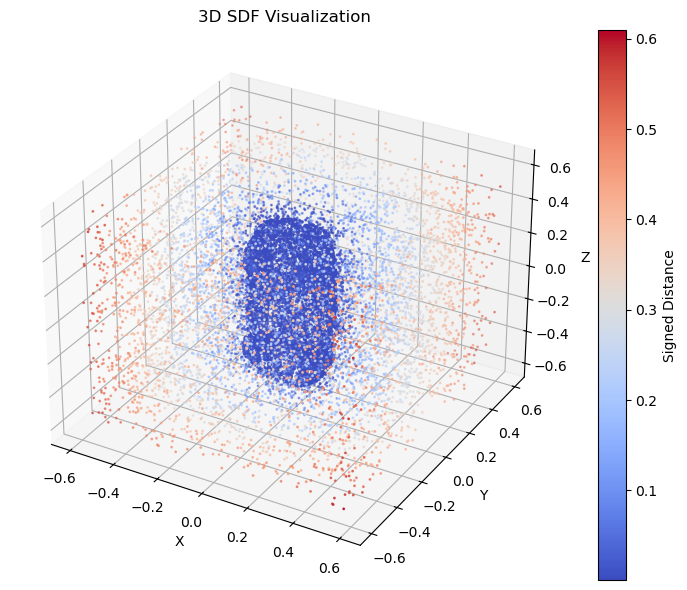

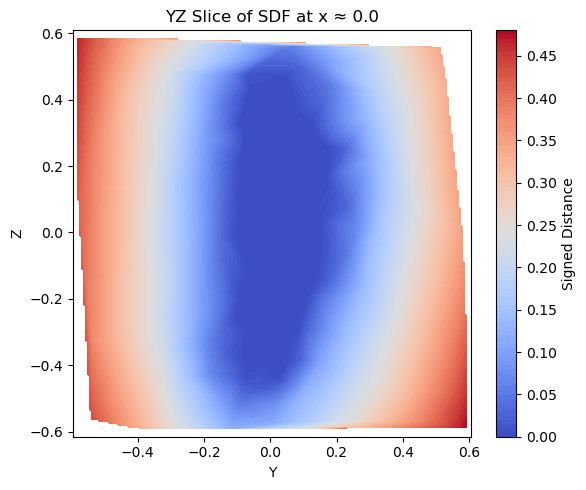

TRUTH


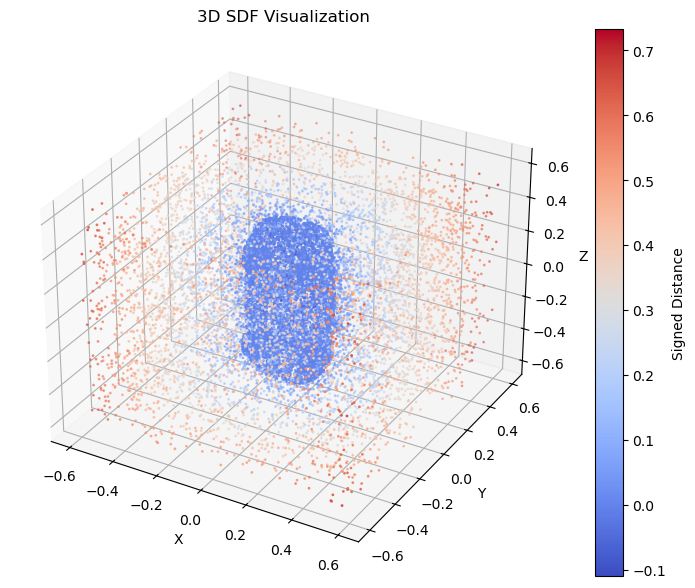

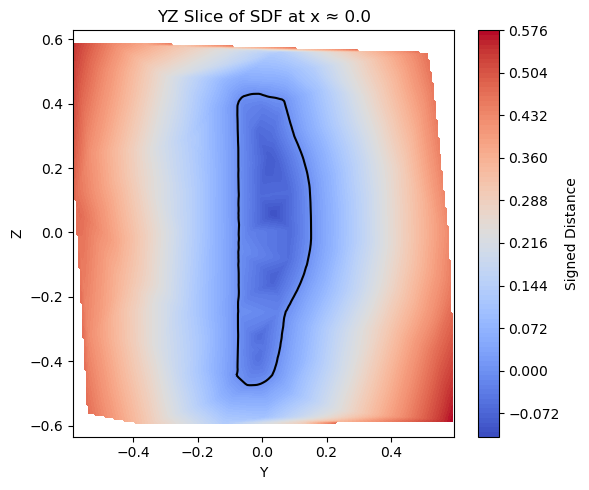

 67%|██████▋   | 1000/1500 [3:23:03<1:46:09, 12.74s/it]

Validation Loss: 0.0017553034704178572


 67%|██████▋   | 1001/1500 [3:23:15<1:44:40, 12.59s/it]

 67%|██████▋   | 1002/1500 [3:23:28<1:43:31, 12.47s/it]

 67%|██████▋   | 1003/1500 [3:23:40<1:42:39, 12.39s/it]

 67%|██████▋   | 1004/1500 [3:23:52<1:41:54, 12.33s/it]

 67%|██████▋   | 1005/1500 [3:24:04<1:41:21, 12.29s/it]

 67%|██████▋   | 1006/1500 [3:24:16<1:41:05, 12.28s/it]

 67%|██████▋   | 1007/1500 [3:24:29<1:40:47, 12.27s/it]

 67%|██████▋   | 1008/1500 [3:24:41<1:40:28, 12.25s/it]

 67%|██████▋   | 1009/1500 [3:24:53<1:40:21, 12.26s/it]

 67%|██████▋   | 1010/1500 [3:25:05<1:39:58, 12.24s/it]

 67%|██████▋   | 1011/1500 [3:25:17<1:39:36, 12.22s/it]

 67%|██████▋   | 1012/1500 [3:25:30<1:39:29, 12.23s/it]

 68%|██████▊   | 1013/1500 [3:25:42<1:38:56, 12.19s/it]

 68%|██████▊   | 1014/1500 [3:25:54<1:38:33, 12.17s/it]

 68%|██████▊   | 1015/1500 [3:26:06<1:38:53, 12.23s/it]

 68%|██████▊   | 1016/1500 [3:26:19<1:38:39, 12.23s/it]

 68%|██████▊   | 1017/1500 [3:26:31<1:38:21, 12.22s/it]

 68%|██████▊   | 1018/1500 [3:26:43<1:38:09, 12.22s/it]

 68%|██████▊   | 1019/1500 [3:26:55<1:37:49, 12.20s/it]

 68%|██████▊   | 1020/1500 [3:27:07<1:37:39, 12.21s/it]

Loss: 0.0015


 68%|██████▊   | 1021/1500 [3:27:20<1:37:35, 12.23s/it]

 68%|██████▊   | 1022/1500 [3:27:32<1:37:19, 12.22s/it]

 68%|██████▊   | 1023/1500 [3:27:44<1:37:04, 12.21s/it]

 68%|██████▊   | 1024/1500 [3:27:56<1:36:55, 12.22s/it]

 68%|██████▊   | 1025/1500 [3:28:08<1:36:38, 12.21s/it]

 68%|██████▊   | 1026/1500 [3:28:21<1:36:24, 12.20s/it]

 68%|██████▊   | 1027/1500 [3:28:33<1:36:21, 12.22s/it]

 69%|██████▊   | 1028/1500 [3:28:45<1:36:11, 12.23s/it]

 69%|██████▊   | 1029/1500 [3:28:57<1:35:54, 12.22s/it]

 69%|██████▊   | 1030/1500 [3:29:09<1:35:35, 12.20s/it]

 69%|██████▊   | 1031/1500 [3:29:22<1:35:20, 12.20s/it]

 69%|██████▉   | 1032/1500 [3:29:34<1:35:10, 12.20s/it]

 69%|██████▉   | 1033/1500 [3:29:46<1:35:06, 12.22s/it]

 69%|██████▉   | 1034/1500 [3:29:58<1:34:51, 12.21s/it]

 69%|██████▉   | 1035/1500 [3:30:11<1:34:36, 12.21s/it]

 69%|██████▉   | 1036/1500 [3:30:23<1:34:29, 12.22s/it]

 69%|██████▉   | 1037/1500 [3:30:35<1:34:14, 12.21s/it]

 69%|██████▉   | 1038/1500 [3:30:47<1:33:57, 12.20s/it]

 69%|██████▉   | 1039/1500 [3:30:59<1:33:53, 12.22s/it]

 69%|██████▉   | 1040/1500 [3:31:12<1:33:38, 12.21s/it]

Loss: 0.0021


 69%|██████▉   | 1041/1500 [3:31:24<1:33:22, 12.21s/it]

 69%|██████▉   | 1042/1500 [3:31:36<1:33:20, 12.23s/it]

 70%|██████▉   | 1043/1500 [3:31:48<1:33:03, 12.22s/it]

 70%|██████▉   | 1044/1500 [3:32:00<1:32:50, 12.22s/it]

 70%|██████▉   | 1045/1500 [3:32:13<1:32:45, 12.23s/it]

 70%|██████▉   | 1046/1500 [3:32:25<1:32:27, 12.22s/it]

 70%|██████▉   | 1047/1500 [3:32:37<1:32:10, 12.21s/it]

 70%|██████▉   | 1048/1500 [3:32:49<1:32:02, 12.22s/it]

 70%|██████▉   | 1049/1500 [3:33:02<1:31:47, 12.21s/it]

 70%|███████   | 1050/1500 [3:33:14<1:31:34, 12.21s/it]

 70%|███████   | 1051/1500 [3:33:26<1:31:24, 12.21s/it]

 70%|███████   | 1052/1500 [3:33:38<1:31:09, 12.21s/it]

 70%|███████   | 1053/1500 [3:33:50<1:30:51, 12.20s/it]

 70%|███████   | 1054/1500 [3:34:03<1:30:45, 12.21s/it]

 70%|███████   | 1055/1500 [3:34:15<1:30:28, 12.20s/it]

 70%|███████   | 1056/1500 [3:34:27<1:30:16, 12.20s/it]

 70%|███████   | 1057/1500 [3:34:39<1:30:07, 12.21s/it]

 71%|███████   | 1058/1500 [3:34:51<1:29:49, 12.19s/it]

 71%|███████   | 1059/1500 [3:35:04<1:29:32, 12.18s/it]

 71%|███████   | 1060/1500 [3:35:16<1:29:28, 12.20s/it]

Loss: 0.0016


 71%|███████   | 1061/1500 [3:35:28<1:29:15, 12.20s/it]

 71%|███████   | 1062/1500 [3:35:40<1:28:58, 12.19s/it]

 71%|███████   | 1063/1500 [3:35:52<1:28:50, 12.20s/it]

 71%|███████   | 1064/1500 [3:36:05<1:28:35, 12.19s/it]

 71%|███████   | 1065/1500 [3:36:17<1:28:24, 12.19s/it]

 71%|███████   | 1066/1500 [3:36:29<1:28:11, 12.19s/it]

 71%|███████   | 1067/1500 [3:36:41<1:27:57, 12.19s/it]

 71%|███████   | 1068/1500 [3:36:53<1:27:43, 12.19s/it]

 71%|███████▏  | 1069/1500 [3:37:06<1:27:42, 12.21s/it]

 71%|███████▏  | 1070/1500 [3:37:18<1:27:27, 12.20s/it]

 71%|███████▏  | 1071/1500 [3:37:30<1:27:10, 12.19s/it]

 71%|███████▏  | 1072/1500 [3:37:42<1:27:03, 12.20s/it]

 72%|███████▏  | 1073/1500 [3:37:54<1:26:44, 12.19s/it]

 72%|███████▏  | 1074/1500 [3:38:06<1:26:26, 12.17s/it]

 72%|███████▏  | 1075/1500 [3:38:19<1:26:24, 12.20s/it]

 72%|███████▏  | 1076/1500 [3:38:31<1:26:06, 12.19s/it]

 72%|███████▏  | 1077/1500 [3:38:43<1:25:55, 12.19s/it]

 72%|███████▏  | 1078/1500 [3:38:55<1:25:52, 12.21s/it]

 72%|███████▏  | 1079/1500 [3:39:07<1:25:41, 12.21s/it]

 72%|███████▏  | 1080/1500 [3:39:20<1:25:25, 12.20s/it]

Loss: 0.0014


 72%|███████▏  | 1081/1500 [3:39:32<1:25:16, 12.21s/it]

 72%|███████▏  | 1082/1500 [3:39:44<1:25:03, 12.21s/it]

 72%|███████▏  | 1083/1500 [3:39:56<1:24:48, 12.20s/it]

 72%|███████▏  | 1084/1500 [3:40:09<1:24:40, 12.21s/it]

 72%|███████▏  | 1085/1500 [3:40:21<1:24:25, 12.21s/it]

 72%|███████▏  | 1086/1500 [3:40:33<1:24:09, 12.20s/it]

 72%|███████▏  | 1087/1500 [3:40:45<1:24:04, 12.22s/it]

 73%|███████▎  | 1088/1500 [3:40:57<1:23:49, 12.21s/it]

 73%|███████▎  | 1089/1500 [3:41:10<1:23:33, 12.20s/it]

 73%|███████▎  | 1090/1500 [3:41:22<1:23:25, 12.21s/it]

 73%|███████▎  | 1091/1500 [3:41:34<1:23:10, 12.20s/it]

 73%|███████▎  | 1092/1500 [3:41:46<1:22:56, 12.20s/it]

 73%|███████▎  | 1093/1500 [3:41:58<1:22:46, 12.20s/it]

 73%|███████▎  | 1094/1500 [3:42:11<1:22:30, 12.19s/it]

 73%|███████▎  | 1095/1500 [3:42:23<1:22:16, 12.19s/it]

 73%|███████▎  | 1096/1500 [3:42:35<1:22:05, 12.19s/it]

 73%|███████▎  | 1097/1500 [3:42:47<1:21:47, 12.18s/it]

 73%|███████▎  | 1098/1500 [3:42:59<1:21:38, 12.19s/it]

 73%|███████▎  | 1099/1500 [3:43:11<1:21:34, 12.21s/it]

Loss: 0.0013


MODEL


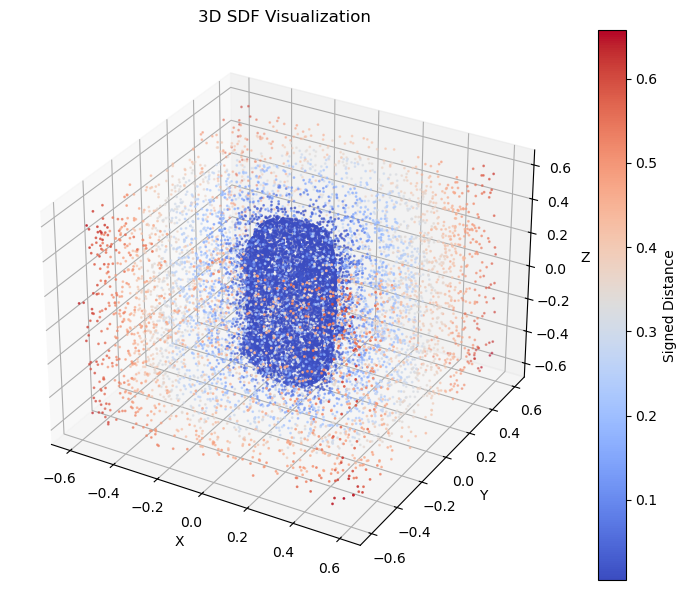

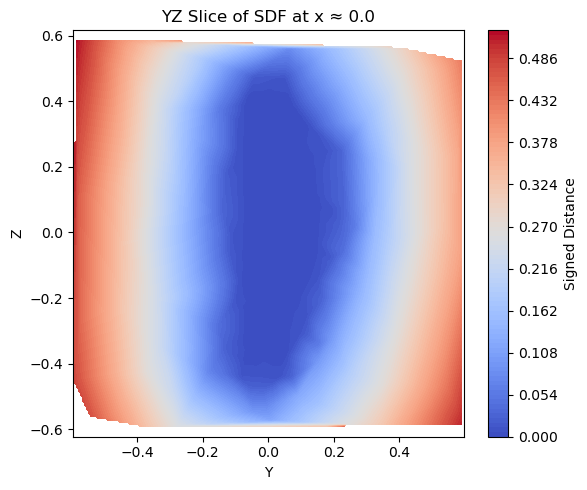

TRUTH


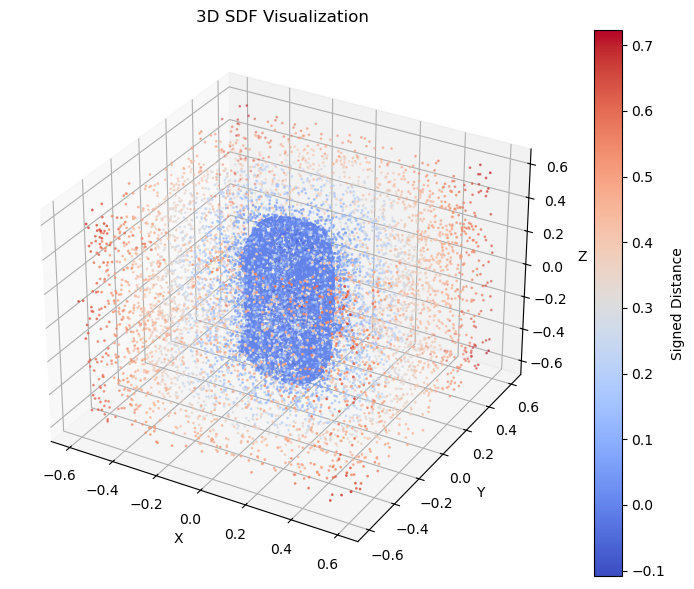

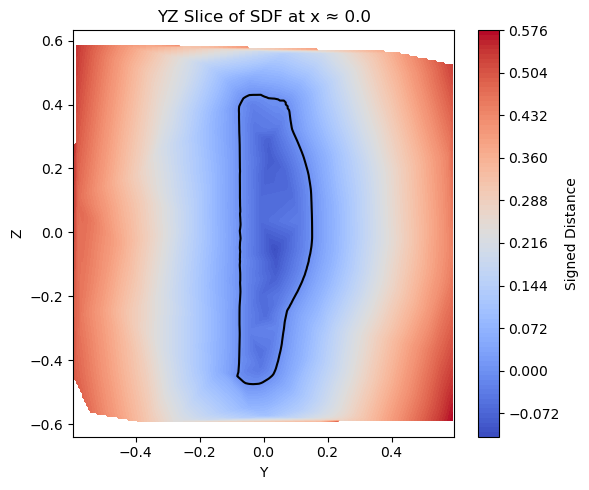

 73%|███████▎  | 1100/1500 [3:43:25<1:24:21, 12.65s/it]

Validation Loss: 0.0008283957140520215


 73%|███████▎  | 1101/1500 [3:43:37<1:23:10, 12.51s/it]

 73%|███████▎  | 1102/1500 [3:43:50<1:22:28, 12.43s/it]

 74%|███████▎  | 1103/1500 [3:44:02<1:21:47, 12.36s/it]

 74%|███████▎  | 1104/1500 [3:44:14<1:21:15, 12.31s/it]

 74%|███████▎  | 1105/1500 [3:44:26<1:20:54, 12.29s/it]

 74%|███████▎  | 1106/1500 [3:44:38<1:20:29, 12.26s/it]

 74%|███████▍  | 1107/1500 [3:44:51<1:20:05, 12.23s/it]

 74%|███████▍  | 1108/1500 [3:45:03<1:19:51, 12.22s/it]

 74%|███████▍  | 1109/1500 [3:45:15<1:19:34, 12.21s/it]

 74%|███████▍  | 1110/1500 [3:45:27<1:19:11, 12.18s/it]

 74%|███████▍  | 1111/1500 [3:45:39<1:19:06, 12.20s/it]

 74%|███████▍  | 1112/1500 [3:45:52<1:18:56, 12.21s/it]

 74%|███████▍  | 1113/1500 [3:46:04<1:18:39, 12.20s/it]

 74%|███████▍  | 1114/1500 [3:46:16<1:18:36, 12.22s/it]

 74%|███████▍  | 1115/1500 [3:46:28<1:18:18, 12.20s/it]

 74%|███████▍  | 1116/1500 [3:46:40<1:18:04, 12.20s/it]

 74%|███████▍  | 1117/1500 [3:46:53<1:18:05, 12.23s/it]

 75%|███████▍  | 1118/1500 [3:47:05<1:17:50, 12.23s/it]

 75%|███████▍  | 1119/1500 [3:47:17<1:17:33, 12.22s/it]

 75%|███████▍  | 1120/1500 [3:47:29<1:17:26, 12.23s/it]

Loss: 0.0016


 75%|███████▍  | 1121/1500 [3:47:42<1:17:08, 12.21s/it]

 75%|███████▍  | 1122/1500 [3:47:54<1:16:53, 12.20s/it]

 75%|███████▍  | 1123/1500 [3:48:06<1:16:41, 12.21s/it]

 75%|███████▍  | 1124/1500 [3:48:18<1:16:29, 12.21s/it]

 75%|███████▌  | 1125/1500 [3:48:30<1:16:13, 12.20s/it]

 75%|███████▌  | 1126/1500 [3:48:43<1:16:11, 12.22s/it]

 75%|███████▌  | 1127/1500 [3:48:55<1:15:57, 12.22s/it]

 75%|███████▌  | 1128/1500 [3:49:07<1:15:38, 12.20s/it]

 75%|███████▌  | 1129/1500 [3:49:19<1:15:36, 12.23s/it]

 75%|███████▌  | 1130/1500 [3:49:31<1:15:23, 12.23s/it]

 75%|███████▌  | 1131/1500 [3:49:44<1:15:06, 12.21s/it]

 75%|███████▌  | 1132/1500 [3:49:56<1:14:58, 12.22s/it]

 76%|███████▌  | 1133/1500 [3:50:08<1:14:44, 12.22s/it]

 76%|███████▌  | 1134/1500 [3:50:20<1:14:25, 12.20s/it]

 76%|███████▌  | 1135/1500 [3:50:33<1:14:25, 12.23s/it]

 76%|███████▌  | 1136/1500 [3:50:45<1:14:12, 12.23s/it]

 76%|███████▌  | 1137/1500 [3:50:57<1:13:58, 12.23s/it]

 76%|███████▌  | 1138/1500 [3:51:09<1:13:52, 12.24s/it]

 76%|███████▌  | 1139/1500 [3:51:22<1:13:37, 12.24s/it]

 76%|███████▌  | 1140/1500 [3:51:34<1:13:21, 12.23s/it]

Loss: 0.0012


 76%|███████▌  | 1141/1500 [3:51:46<1:13:13, 12.24s/it]

 76%|███████▌  | 1142/1500 [3:51:58<1:12:55, 12.22s/it]

 76%|███████▌  | 1143/1500 [3:52:10<1:12:37, 12.21s/it]

 76%|███████▋  | 1144/1500 [3:52:23<1:12:32, 12.23s/it]

 76%|███████▋  | 1145/1500 [3:52:35<1:12:25, 12.24s/it]

 76%|███████▋  | 1146/1500 [3:52:47<1:12:04, 12.22s/it]

 76%|███████▋  | 1147/1500 [3:52:59<1:11:55, 12.23s/it]

 77%|███████▋  | 1148/1500 [3:53:11<1:11:39, 12.21s/it]

 77%|███████▋  | 1149/1500 [3:53:24<1:11:24, 12.21s/it]

 77%|███████▋  | 1150/1500 [3:53:36<1:11:16, 12.22s/it]

 77%|███████▋  | 1151/1500 [3:53:48<1:11:01, 12.21s/it]

 77%|███████▋  | 1152/1500 [3:54:00<1:10:43, 12.19s/it]

 77%|███████▋  | 1153/1500 [3:54:12<1:10:35, 12.21s/it]

 77%|███████▋  | 1154/1500 [3:54:25<1:10:22, 12.20s/it]

 77%|███████▋  | 1155/1500 [3:54:37<1:10:08, 12.20s/it]

 77%|███████▋  | 1156/1500 [3:54:49<1:09:59, 12.21s/it]

 77%|███████▋  | 1157/1500 [3:55:01<1:09:40, 12.19s/it]

 77%|███████▋  | 1158/1500 [3:55:13<1:09:22, 12.17s/it]

 77%|███████▋  | 1159/1500 [3:55:26<1:09:13, 12.18s/it]

 77%|███████▋  | 1160/1500 [3:55:38<1:08:52, 12.15s/it]

Loss: 0.0015


 77%|███████▋  | 1161/1500 [3:55:50<1:08:30, 12.12s/it]

 77%|███████▋  | 1162/1500 [3:56:02<1:08:21, 12.13s/it]

 78%|███████▊  | 1163/1500 [3:56:14<1:08:13, 12.15s/it]

 78%|███████▊  | 1164/1500 [3:56:26<1:08:04, 12.16s/it]

 78%|███████▊  | 1165/1500 [3:56:39<1:08:06, 12.20s/it]

 78%|███████▊  | 1166/1500 [3:56:51<1:07:57, 12.21s/it]

 78%|███████▊  | 1167/1500 [3:57:03<1:07:44, 12.21s/it]

 78%|███████▊  | 1168/1500 [3:57:15<1:07:37, 12.22s/it]

 78%|███████▊  | 1169/1500 [3:57:27<1:07:10, 12.18s/it]

 78%|███████▊  | 1170/1500 [3:57:40<1:07:02, 12.19s/it]

 78%|███████▊  | 1171/1500 [3:57:52<1:06:56, 12.21s/it]

 78%|███████▊  | 1172/1500 [3:58:04<1:06:42, 12.20s/it]

 78%|███████▊  | 1173/1500 [3:58:16<1:06:33, 12.21s/it]

 78%|███████▊  | 1174/1500 [3:58:28<1:06:30, 12.24s/it]

 78%|███████▊  | 1175/1500 [3:58:41<1:06:16, 12.24s/it]

 78%|███████▊  | 1176/1500 [3:58:53<1:05:54, 12.20s/it]

 78%|███████▊  | 1177/1500 [3:59:05<1:05:49, 12.23s/it]

 79%|███████▊  | 1178/1500 [3:59:17<1:05:36, 12.22s/it]

 79%|███████▊  | 1179/1500 [3:59:30<1:05:21, 12.22s/it]

 79%|███████▊  | 1180/1500 [3:59:42<1:05:04, 12.20s/it]

Loss: 0.0028


 79%|███████▊  | 1181/1500 [3:59:54<1:04:49, 12.19s/it]

 79%|███████▉  | 1182/1500 [4:00:06<1:04:35, 12.19s/it]

In [8]:
from tqdm import tqdm

EPOCHS = 1500

def train(epoch):
    model.train()
    for batch in train_loader:
        x, pos, batch, query_pos, query_sdf = process_batch(batch)
        optimizer.zero_grad()
        out = model(x, pos, batch, query_pos).squeeze(-1)
        loss = F.mse_loss(out, query_sdf)  # L1 loss for SDF prediction
        loss.backward()
        optimizer.step()
    
    return loss.item()


for epoch in tqdm(range(1, EPOCHS + 1)):
    loss = train(epoch)
    if epoch % 20 == 0:
        print('Loss: {:.4f}'.format(loss))
    if epoch % 100 == 0:
        show_validation()
        # save model
        torch.save(model.state_dict(), 'pointnet_sdf.pth')